# Introduction



![](duxton.jpg)

82% of all Singaporeans live in HDBs. Older HDB flats are still high in demand despite newer BTOs and hence remains an important market for both home buyers and property agents. 

With fluctuating prices, it is important to know a fair, instrinic value of which a HDB resale flat is worth buying at. Here, we explore how we can use a data-centric approach to evaluating and predicting prices depending on severval factors such as remaining lease, distance to the nearest MRT and other factors detailed below. 

# 1. Data Collection And Cleaning

A main body of our data is retrieved from HDB provided by the Government at data.gov.sg. We also import the necessary packages for this part data cleaning and wrangling. We also proceed to augment the data set by regrouping some data such as the reamining lease (in months), grouping towns by their geographic region, and getting the mean storey level of each flat in the dataset.

In [1]:
import pandas as pd
import numpy as np
import csv
import matplotlib.pyplot as plt
import seaborn as sns
import warnings 

warnings.filterwarnings('ignore')
df = pd.read_csv("resale-flat-prices.csv")
df.head()

#Data Cleaning 
df = df.dropna();

#Data manipulation and computation
#Change Year and Month to numMonths 
def convertMonths(string): 
    if (len(string) <= 8):
        return (int(string[0:2]) * 12); 
    else:
        if(isinstance(string[9:12], int)):
            return (int(string[0:2]) * 12 + int(string[9:12]));
        else:
            return (int(string[0:2]) * 12  + int(string[9:11]));

#augment into original dataSet 
yearsAndMonths = pd.Series(df['remaining_lease'].astype(str))
df['months_remaining_lease'] = yearsAndMonths.apply(convertMonths)

#Group town by region 
#get towns 
towns = df['town'].unique().tolist() 

#write csv to dictionary 
f = open('towns_data.csv', "r");
reader = csv.reader(f);
towns_data = {}
regionMapper = {}
for row in reader:
    regionMapper[row[0]] = row[1] #mapper for region
    towns_data[row[0]] = [row[1], row[2], row[3], row[4]]

#augment df to include region using mapping
df['region'] = df['town'].map(regionMapper)

#augment data for time analysis by town
resale_price_by_time = df.filter(['month','town','resale_price'])
resale_price_by_time['monthdt'] = resale_price_by_time['month'].astype('datetime64[ns]')
resale_price_by_time_pivot = resale_price_by_time.pivot_table(index = 'month', columns = ['town'], values = ['resale_price'], aggfunc = np.mean)

#augment data for time analysis by region 
resale_price_by_time_region = df.filter(['month', 'region', 'resale_price'])
resale_price_by_time_region['monthdt'] = resale_price_by_time_region['month'].astype('datetime64[ns]')
resale_price_by_time_region = resale_price_by_time_region.pivot_table(index = "monthdt", columns = ['region'], values = ['resale_price'], aggfunc = np.mean)

#append story range 
def getMeanStory(string): 
    return (int(string[0:2]) + int(string[6:8])) / 2
df['mean_storey_range'] = pd.Series(df['storey_range'].astype(str)).apply(getMeanStory)

#Extract only block numbers 
def convertBlock(block):
    try:
        return int(block)
    except:
        return int(block[:-1])
df["block_number"] = df['block'].apply(convertBlock)

#Extract month number only
def getMonth(date):
    return int(date[-2:])
df['month_number'] = df['month'].apply(getMonth)

#compute price per square meter
df['price_per_area'] = df['resale_price'] / df['floor_area_sqm']

#Write processed data to new file
#df.to_csv("processed-resale-flat-price.csv", index = False)
df.head()

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,months_remaining_lease,region,mean_storey_range,block_number,month_number,price_per_area
0,2017-01,ANG MO KIO,2 ROOM,406,ANG MO KIO AVE 10,10 TO 12,44.0,Improved,1979,61 years 04 months,232000.0,736,NORTH-EAST,11.0,406,1,5272.727273
1,2017-01,ANG MO KIO,3 ROOM,108,ANG MO KIO AVE 4,01 TO 03,67.0,New Generation,1978,60 years 07 months,250000.0,727,NORTH-EAST,2.0,108,1,3731.343284
2,2017-01,ANG MO KIO,3 ROOM,602,ANG MO KIO AVE 5,01 TO 03,67.0,New Generation,1980,62 years 05 months,262000.0,749,NORTH-EAST,2.0,602,1,3910.447761
3,2017-01,ANG MO KIO,3 ROOM,465,ANG MO KIO AVE 10,04 TO 06,68.0,New Generation,1980,62 years 01 month,265000.0,745,NORTH-EAST,5.0,465,1,3897.058824
4,2017-01,ANG MO KIO,3 ROOM,601,ANG MO KIO AVE 5,01 TO 03,67.0,New Generation,1980,62 years 05 months,265000.0,749,NORTH-EAST,2.0,601,1,3955.223881


# 2. Feature Engineering

We note that the dataset itself may not contain all the features/attributes which contribute to a flat's valuation. We hence decided to also include other attributes such as it's proximity to the MRT, malls and schools, which is an important factor for many homebuyers. 

Since this data was not found on the Government's databse, we relied on OneMap.sg's API for geocoding every datapoint in our dataset with it's latitude and longitude coordinates, followed by using Google Places API to locate the nearest MRT from the given coordinates. These coordinates also allow us to visualize the data on a live map using Google Maps API.

Note: As these API queries require payment after a certain volume of queries, the API key is hidden from these cells and stored in a seperate file, not included in this package. Please use your own API key should you wish to use this code.

The code required to scrape these data is found below

## 2.1 Retrieving HDB Coordinates and Nearest MRT Coordinates

In [2]:
import sys 
try:
    import googlemaps ##if googlemaps package is not installed on local machine, pip install first
    import pprint
except ImportError as e:
    !pip install -U googlemaps #note: if this does not work, please pip install gmaps on your local device
    !pip install pprint
import urllib
import googlemaps
import json #required to process JSON response
import requests 
import pprint # pretty print package to read JSON response better
import time
import math
import googleAPITOKEN #seperate python file containing API Key
from geopy import distance #Haversine's formula to calcaulte distances from coordinate pairs

In [ ]:
#Preliminiary extraction using onemap.sg api
class Coord:
    def __init__(self, lat, lng, address):
        self.lat = lat
        self.lng = lng
        self.address = address
    def getLat(self):
        return float(self.lat)
    def getLng(self):
        return float(self.lng)
    def getAddress(self):
        return str(self.address)

#estimate distance by using Haversine's Formula 
def estDist(beginLng, beginLat, endLng, endLat):
    return distance.distance((beginLat, beingLng), (endLat, endLng)).km
    
dfBlock = df.filter(['town', 'street_name', 'block']) ##extract relevant information for data scrapping

#Specify data to be extracted
outputDF = pd.DataFrame(columns = ['street_name','blockNumber','hdb_lat', 'hdb_lng','nearestMRT', 'nearest_mrt_lat', 'nearest_mrt_lng', 'dist_to_mrt'])
nearestMRTList = {} #list of MRTs so that re-querying is not required

for index, row in dfBlock.iterrows():
    try:
        #Set up query URL
        queryURL = 'https://developers.onemap.sg/commonapi/search?searchVal='
        queryParams = "&returnGeom=Y&getAddrDetails=Y"
        
        #input the address to query
        hdbAddress = str(row['block']) + " " + str(row['street_name'])
        
        #format into 1 queryURL
        queryString = queryURL + hdbAddress + queryParams 
        
        #Query from API, use JSON formatting
        rsp = requests.get(queryString)
        data = json.loads(rsp.content)
        
        #Extract Data from API
        if (data['found'] != 0):
            hdbCoord = Coord(data['results'][0]['LATITUDE'], data['results'][0]['LONGITUDE'], data['results'][0]['ADDRESS'])
        else:
            hdbCoord = Coord(0, 0, "")
            
        #Extract Nearest MRT Data. Extract from memoized list, else do a new query
        if (row['town'] in nearestMRTList):
            nearestMRTCoord = nearestMRTList[row['town']]
        else:
            townMRT = str(row['town']) + " MRT"
            queryString = queryURL + townMRT + queryParams
            rsp = requests.get(queryString)
            data = json.loads(rsp.content)
            #pprint.pprint(data)
            if (data['found'] != 0 ):
                nearestMRTCoord = Coord(data['results'][0]['LATITUDE'], data['results'][0]['LONGITUDE'], data['results'][0]['ADDRESS'])
            else: 
                nearestMRTCoord = Coord(0, 0, "")
            nearestMRTList[row['town']] = nearestMRTCoord
        
        #Calculate approximate distance
        dist = estDist(hdbCoord.getLat(), hdbCoord.getLng(), nearestMRTCoord.getLat(), nearestMRTCoord.getLng())
        
        #Append result
        outputDF = outputDF.append(pd.Series(
                [row['street_name'], row['block'], hdbCoord.getLat(), hdbCoord.getLng(),
                nearestMRTCoord.getAddress(), nearestMRTCoord.getLat(), nearestMRTCoord.getLng(), dist], 
                index = outputDF.columns),
                ignore_index = True)
        #count = count + 1
        #if (count % 100 == 0):
            #print (count) #to keep track of querying progress
    except:
        print("Error")
        time.sleep(15) #API has query rate restrictions, need program to break for a bit before re-querying
print("Done")

#write output
outputDF.to_csv("nearestMRTOneMap.csv", index = False)

In [ ]:
#handling the special case of St. George's Road. OneMap unable to reach st.George, requires "Saint George"

df2 = pd.read_csv("nearestMRTData.csv")
#use onemap's API for special case of st.george's road
queryURL = 'https://developers.onemap.sg/commonapi/search?searchVal='
queryParams = "&returnGeom=Y&getAddrDetails=Y" #&pageNum=1
hdbAddress = "saint george's road"
queryString = queryURL + hdbAddress + queryParams 
rsp = requests.get(queryString)
data = json.loads(rsp.content)
#pprint.pprint(data)
count = 0
if (data['found'] != 0 ):
    nearestMRTCoord = Coord(data['results'][0]['LATITUDE'], data['results'][0]['LONGITUDE'], data['results'][0]['ADDRESS'])
for i in range (0, len(df2.index)):
    if (df2['hdb_lat'].values[i] == 0 or df2['hdb_lng'].values[i] < 0):
        if (df2['street_name'].values[i] == "ST. GEORGE'S RD"):
            queryAddress = str(df2['blockNumber'].values[i]) + " " + "saint george's road"    
            queryString = queryURL + queryAddress + queryParams 
            rsp = requests.get(queryString)
            data = json.loads(rsp.content)
            if (data['found'] != 0 ):
                df2['hdb_lat'].values[i] = data['results'][0]['LATITUDE']
                df2['hdb_lng'].values[i] = data['results'][0]['LONGITUDE']
                #print(str(data['results'][0]['LONGITUDE']) + "i = " + str(i))
                #print(str(df2['hdb_lng'].values[1] ))
                count = count + 1
print("updated: " + str(count))
df2[df2['hdb_lng'] < 0].head()

#update dataset
df2.to_csv("nearestMRTOneMap.csv", index = False) #Contains HDB Coordinates

In [ ]:
#Google Maps required as onemapsg fails some queries, this code is to refine the search
#Extracting Data from Google API
#NOTE: THIS CELL DOES NOT NEED TO BE RUN AGAIN. DISPLAYING FOR VERIFICATION PURPOSES
#PLEASE OBTAIN YOUR OWN GOOGLE API TOKEN TO USE THIS CODE 

#estimate Euclidian distance by pythagoras
def estDist(beginLng, beginLat, endLng, endLat):
    return distance.distance((beginLat, beingLng), (endLat, endLng)).km

geocode_api_key = googleAPITOKEN.geocode_api_key #api key is protected, please use your own

#Method to find nearest MRT using Google Places API. Takes in hdb lat and lng as input data. Requires API key
def getNearestMRT(lat, lng, apiKey):
    gmaps = googlemaps.Client(ley = apiKey)
    #accept lat,lng as string argument input 
    geocode_as_string = str(lat) + ", " + str(lng)
    places_result = gmaps.places_nearby(location = geocode_as_string ,
                                        radius = 2000, 
                                        keyword = "MRT", 
                                        type = 'subway_station')
    if (places_result['status'] == 'ZERO_RESULTS'):
        print("No result" + row['street_name'] + str(row['block'])) #For debugging
    else:
        nearestMRT = places_result['results'][0]['name']
        nearestMRTCoord = places_result['results'][0]['geometry']['location']
        dist = estDist(geocode_coord['lat'], geocode_coord['lng'], nearestMRTCoord['lat'], nearestMRTCoord['lng'])
    outputData = {}
    outputData['mrt_name'] = nearestMRT
    outputData['lat'] = nearestMRTCoord['lat']
    outputData['lng'] = nearestMRTCoord['lng']
    ouptutData['dist'] = estDist(lat, lng, nearestMRTCoord['lat'], nearestMRTCoord['lng'] )
        
    
#only need street name and block 
dfBlock = df.filter(['street_name', 'block'])
#set up client package
gmaps = googlemaps.Client(key = geocode_api_key)

#dfBlock = dfBlock[:5] #To test the API
outputDF = pd.DataFrame(columns = ['town','blockNumber','nearestMRT', 'nearest_mrt_lat', 'nearest_mrt_lng', 'dist_to_mrt'])
for index, row in dfBlock.iterrows():
    queryAddress = str(row['street_name']) + " Blk " + str(row['block'])
    geocode_result = gmaps.geocode(queryAddress)
    geocode_coord = geocode_result[0]['geometry']['location']
    #print(geocode_coord)
    geocode_as_string = str(geocode_coord['lat']) + "," + str(geocode_coord['lng'])
    #print("Geocode: " + geocode_as_string) #uncomment this to see pretty things
    places_result = gmaps.places_nearby(location = geocode_as_string ,
                                        radius = 2000, 
                                        keyword = "MRT", 
                                        type = 'subway_station')
    #pprint.pprint(places_result) #uncomment this to see json http response
    #data validation 
    if (places_result['status'] == 'ZERO_RESULTS'):
        print("No result" + row['street_name'] + str(row['block']))
        outputDF = outputDF.append(pd.Series([row['street_name'], row['block'], None, None, None, None,], index = outputDF.columns), ignore_index = True)
        continue
    nearestMRT = places_result['results'][0]['name']
    #nearestMRTCoord is a dict of 2 keys: lat, lng
    nearestMRTCoord = places_result['results'][0]['geometry']['location']
    #print("MRT: " + nearestMRT)
    dist = estDist(geocode_coord['lat'], geocode_coord['lng'], nearestMRTCoord['lat'], nearestMRTCoord['lng'])
    #pprint.pprint(places_result) #uncomment this to see json http response
    outputDF = outputDF.append(pd.Series(
                [row['street_name'], row['block'], nearestMRT, nearestMRTCoord['lat'], nearestMRTCoord['lng'], dist], 
                index = outputDF.columns),
                ignore_index = True)
    
outputDF.head()
#write output to seperate csv file so that re-querying is not required 
outputDF.to_csv("nearestMRTData.csv", index = False)

In [ ]:
#Refine nearest MRT Data using manual shortest distance calculation, O(NM)
mrtDF = pd.read_csv("mrtsg.csv") #dataset containing all of Singapore's MRTs and their locations
mrtDF = mrtDF.rename(columns = {"Latitude" : "lat", "Longitude": "lng" })
mrtDF.head()

#Method which finds the nearest using geopy method, Haversine formula
def findNearest(hdb_lat, hdb_lng, info_df, attr_name, attr_lat_name, attr_lng_name):
    dist = 1e+10
    target_name = ""
    lat = 0
    lng = 0
    for index, row in info_df.iterrows():
        newDist = distance.distance((hdb_lat,hdb_lng), (row[attr_lat_name], row[attr_lng_name])).km
        if (newDist < dist):
            dist = newDist
            target_name = row[attr_name]
            lat = row[attr_lat_name]
            lng = row[attr_lng_name]
    return [target_name, lat, lng, dist]

df = pd.read("nearestMRTOneMap.csv")

outputDF = pd.DataFrame(columns = ['town','blockNumber','nearestMRT', 'nearest_mrt_lat', 'nearest_mrt_lng', 'dist_to_mrt'])
count = 0

for index, row in df.iterrows():
    out = findNearest(row['hdb_lat'], row['hdb_lng'], mrtDF, "STN_NAME", "lat", "lng")
    outputDF = outputDF.append(pd.Series(
                [row["street_name"], row["block"], out[0], out[1], out[2], out[3]], 
                index = outputDF.columns),
                ignore_index = True)
    count += 1
    if (count % 100 == 0):
        print(count)
        
outputDF.to_csv("nearest-mrt.csv", mode = "a", index = False)

## 2.2 Extracting Mall Data

We obtained a full list of malls in Singapore from Wikipedia (https://en.wikipedia.org/wiki/List_of_shopping_malls_in_Singapore), before using OneMap.sg API to retrieve its coordinates.

In [ ]:
##Adding mall data to dataset 
dfMall = pd.read_csv("mallsg.csv")
dfMall.head()

def getCoord(queryURL, queryParams, mall_name):
    #format into 1 queryURL
    queryString = queryURL + mall_name + queryParams 
        
    #Query from API, use JSON formatting
    rsp = requests.get(queryString)
    data = json.loads(rsp.content)
    output = {}
    #Extract Data from API
    #print(mall_name)
    if (data['found'] != 0):
        output['lat'] = data['results'][0]['LATITUDE']
        output['lng'] = data['results'][0]['LONGITUDE']
        output['address'] = data['results'][0]['ADDRESS']
    else:
        output['lat'], output['lng'], output['address'] = 0, 0 , ""
    return output
outputDF = pd.DataFrame(columns = ['mall_name','mall_lat' ,'mall_lng', 'mall_address'])
for index, row in dfMall.iterrows():
    queryURL = 'https://developers.onemap.sg/commonapi/search?searchVal='
    queryParams = "&returnGeom=Y&getAddrDetails=Y" 
    out = getCoord(queryURL, queryParams, row['mall_name'])
    outputDF = outputDF.append(pd.Series([row['mall_name'], out["lat"], out["lng"], out["address"]],
                                        index = outputDF.columns),
                                        ignore_index = True)
print("Total Rows:" + str(len(outputDF)))
outputDF.to_csv("mall-coordinate-data.csv", index = False) #Save in a seperate file

## 2.3 Extracting School Data

A full list of schools in Singapore can be found on data.gov.sg. We used a similar method to retrieve coordinate data on schools

In [ ]:
#school data 
dfSch = pd.read_csv("general-information-of-schools.csv")
dfSch.head()

outputDF = pd.DataFrame(columns = ["sch_name", "sch_lat", "sch_lng", "sch_address"])
for index, row in dfSch.iterrows():
    queryURL = 'https://developers.onemap.sg/commonapi/search?searchVal='
    queryParams = "&returnGeom=Y&getAddrDetails=Y" 
    school_name = row['school_name']
    if("ST." in school_name):
        school_name = school_name.replace("ST.", "Saint")
    out = getCoord(queryURL, queryParams, school_name)
    outputDF = outputDF.append(pd.Series([row['school_name'], out["lat"], out["lng"], out["address"]],
                                        index = outputDF.columns),
                                        ignore_index = True)

outputDF.to_csv("school-coordinate-data.csv", index = False)

## 2.4 Computing Nearest Malls and Schools

Using our extracted data from *2.2* and *2.3*, we can now proceed to calculate and find the nearest school and mrt and their distances from each HDB flat. 

In [ ]:
df = pd.read_csv("nearestMRTOneMap.csv")
dfSch = pd.read_csv("school-coordinate-data.csv")
dfMall = pd.read_csv("mall-coordinate-data.csv")

def findNearest(hdb_lat, hdb_lng, info_df, attr_name, attr_lat_name, attr_lng_name):
    dist = 1e+10
    target_name = ""
    lat = 0
    lng = 0
    for index, row in info_df.iterrows():
        newDist = distance.distance((hdb_lat,hdb_lng), (row[attr_lat_name], row[attr_lng_name])).km
        if (newDist < dist):
            dist = newDist
            target_name = row[attr_name]
            lat = row[attr_lat_name]
            lng = row[attr_lng_name]
    return [target_name, lat, lng, dist]

outputDF = pd.DataFrame(columns = ['street_name','blockNumber',
                                   'nearest_mall', 'nearest_mall_lat', 'nearest_mall_lng', 'dist_to_mall',
                                  "nearest_sch", "nearest_sch_lat", "nearest_sch_lng", "dist_to_sch"])
count = 0
df = df[20052:]
for index, row in df.iterrows():
    #find nearest mall
    outMall = findNearest(row['hdb_lat'], row['hdb_lng'], dfMall, "mall_name", "mall_lat", "mall_lng")
    #find nearest school 
    outSch = findNearest(row['hdb_lat'], row['hdb_lng'], dfSch, "sch_name", "sch_lat", "sch_lng")
    outputDF = outputDF.append(pd.Series(
            [row["street_name"], row["blockNumber"], outMall[0], outMall[1], outMall[2], outMall[3], 
            outSch[0], outSch[1], outSch[2], outSch[3]], 
            index = outputDF.columns),
            ignore_index = True)
    count +=1
    if (count % 100 == 0):
        print(count)
print("Done")
outputDF.to_csv("nearest-mall-and-sch.csv", mode = "a", index = False)

## 2.5 Combining Data

In [60]:
#combine both data into one dataframe
hdbData = pd.read_csv("updatedMRTOneMap.csv")
hdbData = hdbData.filter(['hdb_lat','hdb_lng'])
mrtData = pd.read_csv("nearest-mrt.csv")
mrtData = mrtData.filter(['nearestMRT', "nearest_mrt_lat", "nearest_mrt_lng", "dist_to_mrt"])
mall_sch_data = pd.read_csv("nearest-mall-and-sch.csv")
mall_sch_data = mall_sch_data.filter(["nearest_mall", "nearest_mall_lat", "nearest_mall_lng", "dist_to_mall",
                              "nearest_sch", "nearest_sch_lat", "nearest_sch_lng", "dist_to_sch"])
df = df.join(hdbData)
df = df.join(mrtData)
df = df.join(mall_sch_data)

#Write to a final dataset
df.to_csv("finalDataSet.csv", index = False)

# 3. Data Visualization

We first import all necessary packages and remove related attributes from the final data set owing to derivation of certain attributes from the original data, eg. `months_remaining_lease` from `remaining_lease`. 

In [3]:
df = pd.read_csv("finalDataSet.csv")
df = df.drop(["remaining_lease", "storey_range"], axis = 1)

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
%matplotlib inline

from scipy.stats import pearsonr
from scipy.stats import linregress

#Bokeh plotting package
from bokeh.models import HoverTool, NumeralTickFormatter, ColumnDataSource, GMapOptions, ColorBar, Whisker, LinearColorMapper
from bokeh.plotting import figure, output_notebook, show, gmap
from bokeh.io import output_file, show
from bokeh.transform import linear_cmap, LinearColorMapper, transform
from bokeh.palettes import Spectral6, Viridis5, plasma
import itertools #to iterate through color palette

import googleAPITOKEN as googleApiKey #please use your own Google API key for 3.2

## 3.1 Average HDB Resale Price By Town

A preliminary analysis can first be done on the average resale prices segregated by the towns they are in

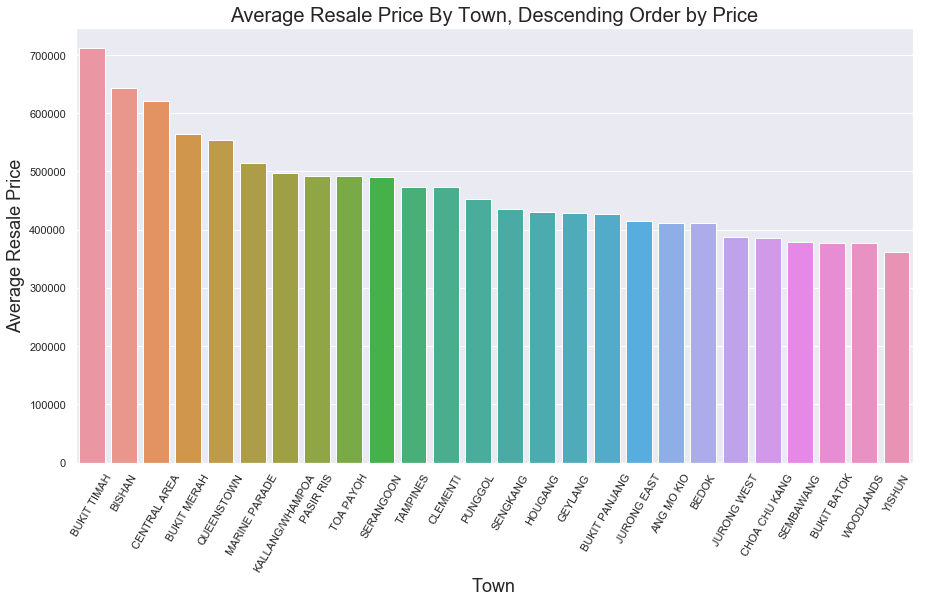

In [4]:
#Preliminary Data Visualization

#Average price by town, ascending 
avg_prices_by_town = df.filter(['town','resale_price'])
avg_prices_by_town = pd.DataFrame(avg_prices_by_town.groupby('town').mean().sort_values(by = 'resale_price', ascending = False).reset_index())
sns.set(style = "darkgrid")
plt.figure(figsize = (15, 8))
plt.ioff()

avg_prices_by_town_plot = sns.barplot(x = "town", y = "resale_price", data = avg_prices_by_town)

avg_prices_by_town_plot.set_xticklabels(labels = avg_prices_by_town['town'].unique(), rotation = 60)
plt.xlabel("Town", fontsize = 18)
plt.ylabel("Average Resale Price", fontsize = 18)
plt.title("Average Resale Price By Town, Descending Order by Price", fontsize = 20)
plt.ioff()

plt.show(avg_prices_by_town_plot)

## 3.2 Geographical Visualization 

We can get a better understanding of the relative resale prices by and the number of units available in each town by visualizing the data with a map. To do so, we superimpose the HDB resale flats onto a static Google Map, using the coordinates we extracted above to plot on the map. The intensity of the colour represents the relative price of the HDB resale flat. The concentration of resale flats can be seen by the clustering of plots on the map. The toolbar on the right allows the user to inspect regions of the map in greater detail.

In [5]:
output_notebook() #So that output is not opened in a seperate tab

map_options = GMapOptions(lat = 1.3531, lng= 103.8198, map_type="roadmap", zoom = 11)

hdb_lat = df.hdb_lat.tolist()
hdb_lng = df.hdb_lng.tolist()
hdb_resale_price = df['resale_price']
#normalize hdb resale price 
hdb_resale_price = ((hdb_resale_price - hdb_resale_price.mean())/hdb_resale_price.std())

p = gmap(googleApiKey.geocode_api_key, map_options, title = "HDB Resale Flats Distribution in Singapore")
source = ColumnDataSource(
    data = dict(lat = hdb_lat, lon = hdb_lng, color = hdb_resale_price, size = hdb_resale_price)
)

mapper = linear_cmap(field_name='color', palette = Spectral6 ,low = min(hdb_resale_price) ,high = max(hdb_resale_price))
color_mapper = LinearColorMapper(palette = Viridis5)
color_bar = ColorBar(color_mapper = mapper['transform'], width=8,  location=(0,0))
p.circle(x="lon", y="lat", color = mapper, size = 0.8, fill_alpha = 0.5, source=source)
p.add_layout(color_bar, 'right')
p.height = 500
p.width = 900
show(p)

Loading BokehJS ...

## 3.3 Distribution of HDB Resale Price By Town

To better visualize the distirbution of the prices by the towns, the use of `violinplot` is appropriate to compare the relative **median**, **range** and **frequency** of prices. The thickness of the band indicates the frequency of that price level, and the inner thick band represents the interquartile range.

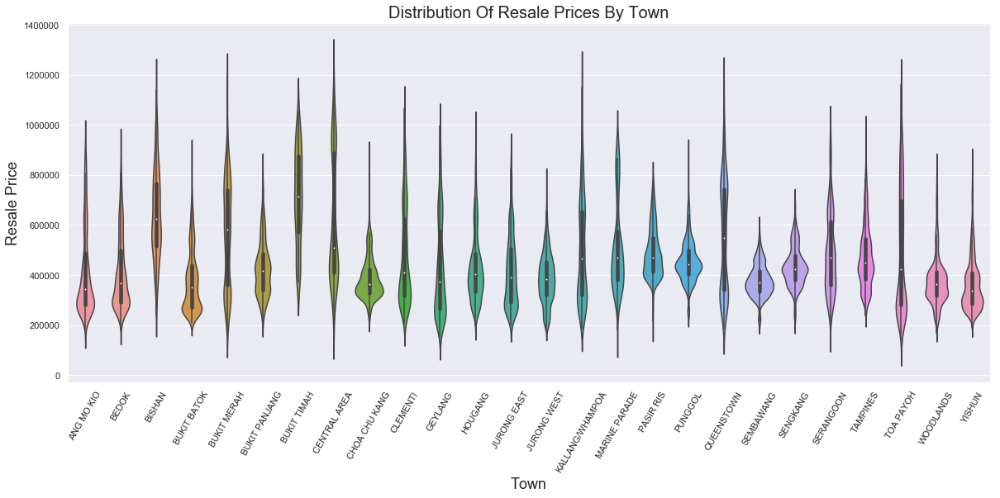

In [83]:
#Price visualization by town
plt.figure(figsize = (20, 8))

prices_by_town_plot = sns.violinplot('town', 'resale_price', data = df)

prices_by_town_plot.set_xticklabels(labels = towns, rotation = 60)
plt.xlabel("Town", fontsize = 18)
plt.ylabel("Resale Price", fontsize = 18)
plt.title("Distribution Of Resale Prices By Town", fontsize = 20)
plt.ioff()

## 3.4 Analysis Of Price Fluctuations Over Time, By Town

We can also see how prices has changed over the years using a simple line graph

<Figure size 1440x576 with 0 Axes>

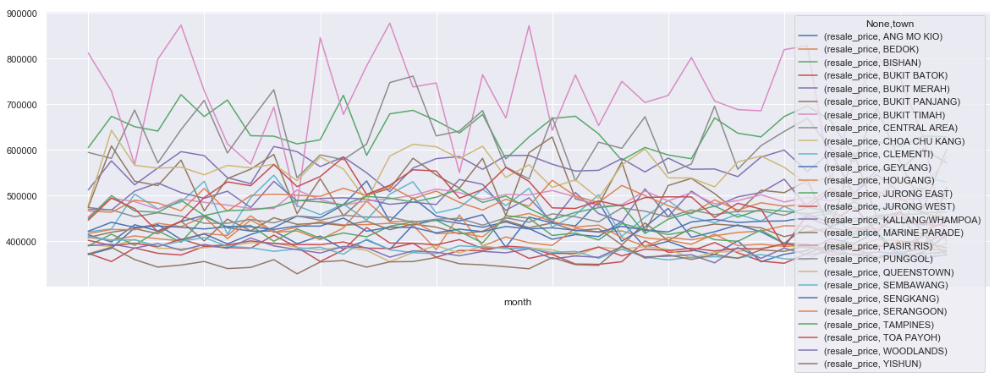

In [84]:
#Time series analysis, by town
plt.figure(figsize = (20, 8))
resale_price_by_time_pivot.plot(figsize = (20, 6))
plt.ioff()

## 3.5 Analysis of Price Fluctuations Over Time, By Region

As there are many towns in Singapore (A total of 26 towns), we can group these towns by the *region* they are in. This has been done by using a `mapper` during in data processing above. The classification is based off the Government's method of classifying the towns as provided by LTA. To enhance this visualization, we use plotting packages provided by `bokeh`, which allows for the highlighting of specific points on the graph by hovering over the points. Here, all the points which have around the saem resale price will be marked out when hovered upon. 

In [6]:
#using Bokeh for hover plot, time series analysis by region
output_notebook()

x = resale_price_by_time_region.index.to_series()
y = resale_price_by_time_region['resale_price']

plot = figure(plot_width=600, plot_height=300, x_axis_type="datetime", tools="",
              toolbar_location=None, title='Average Resale Price Over Time, By Region')
colors = ['blue', 'magenta', 'red', 'purple', 'green']
i = 0
for region in y.columns:
    plot.line(x, y[region], line_dash="4 4", line_width=1, color=colors[i], legend = region)
    cr = plot.circle(x,y[region], size = 10, fill_color="grey", hover_fill_color="firebrick",
                fill_alpha=0.1, hover_alpha=0.3,
                line_color=None, hover_line_color="white")
    plot.add_tools(HoverTool(tooltips=None, renderers=[cr], mode = 'hline'))
    i += 1
plot.xaxis.axis_label = "Time"
plot.yaxis.axis_label = "Average Resale Price"  
plot.yaxis[0].formatter = NumeralTickFormatter(format = "$000,000")
plot.height = 500
plot.width = 900
show(plot)

Loading BokehJS ...

Alternatively, we can use `seaborn`'s `lineplot` to visualize the prices and its confidence bands at every period of time. We observe that the **Central** region consistently has the highest resale prices over time, followed by the **East** and **North** East. Generally, flats in the **North** are cheaper. 

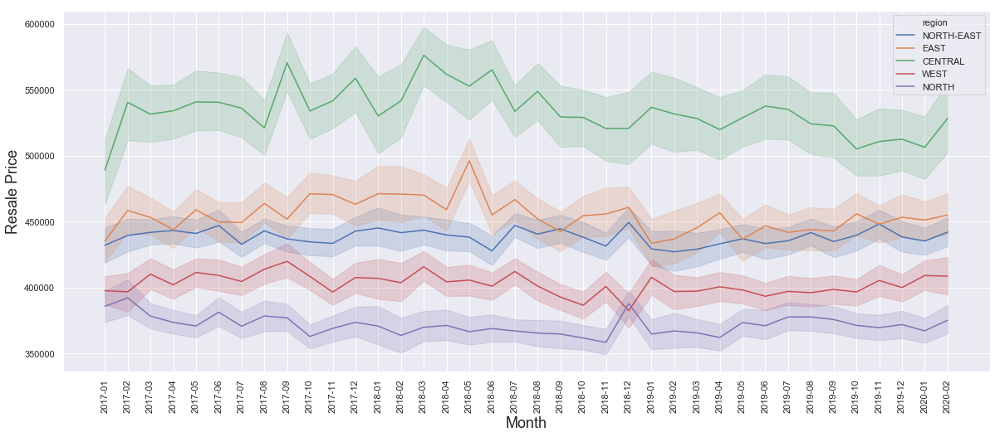

In [27]:
sns.set(style = "darkgrid")
plt.figure(figsize = (20, 8))

lineplt = sns.lineplot(x = "month", y = "resale_price", hue = "region", data = df)

plt.ylabel("Resale Price", fontsize = 18)
plt.xlabel("Month", fontsize = 18)
plt.xticks(rotation = 90)
plt.legend()
plt.ioff()

To better visualize the impact of the region without the effect of floor area, we can find the price per square metre to do the analysis again. We note here that unlike in the previous analysis, it appears that properties in the **North-East** on average may be more expensive than that of the **East**. Consequently, we can also then infer that floor area in the **East** may be larger.

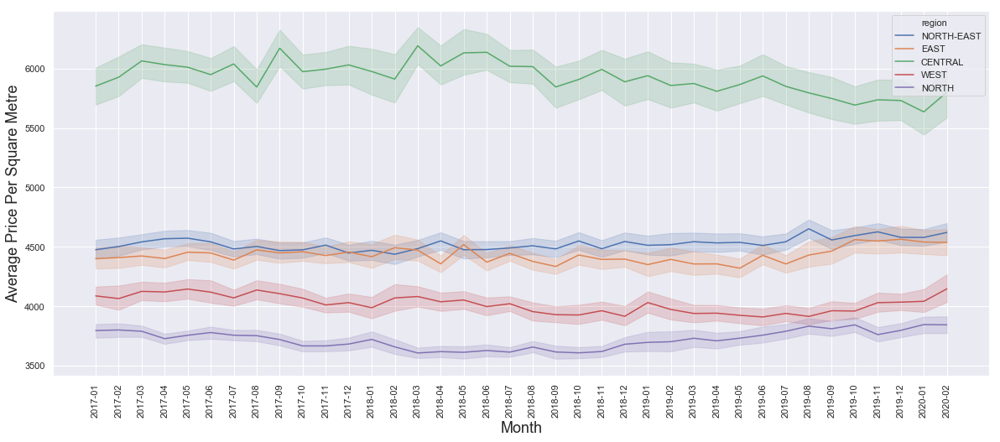

In [68]:
plt.figure(figsize = (20, 8))

lineplt = sns.lineplot(x = "month", y = "price_per_area", hue = "region", data = df)

plt.ylabel("Average Price Per Square Metre", fontsize = 18)
plt.xlabel("Month", fontsize = 18)
plt.xticks(rotation = 90)
plt.legend(loc = "upper right")
plt.ioff()

##  3.6 Analysis of Floor Area on Resale Price

One of the key factors in property prices is its floor area. For a more robust visualization, a `joint plot` is used to visualize the relationship between `resale price` and `floor area`. We can also observe the frequencies and the distributions of both variables given by the histogram plotted. There is a apparent positive linear relationship between both variables, which we will analyse further later.

Pearson Coefficient: 0.632
Slope of Regression Line: 4003.617


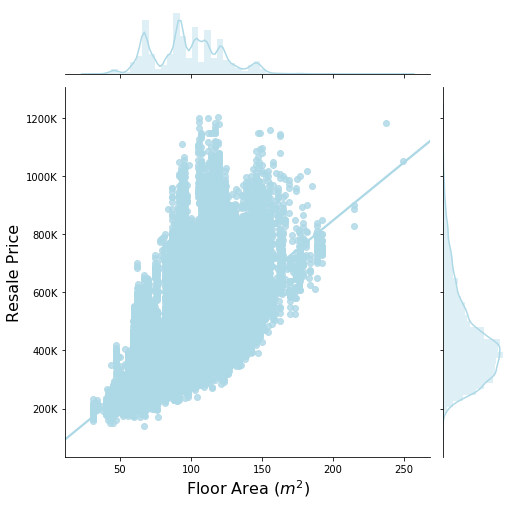

In [16]:
p = sns.jointplot(x = 'floor_area_sqm', y = 'resale_price', data = df, color = "lightblue", kind = "reg", height = 7)

plt.xlabel("Floor Area ($m^{2}$)",  fontsize = 16)
plt.ylabel("Resale Price",  fontsize = 16)
ylabels = ["{0:.0f}K".format(y) for y in p.ax_joint.get_yticks()//1000]
p.ax_joint.set_yticklabels(ylabels)
plt.ioff()

r = pearsonr(df['floor_area_sqm'].values, df['resale_price'].values)
regress = linregress(df['floor_area_sqm'].values, df['resale_price'].values)

print("Pearson Coefficient: " + str(round(r[0],3)))
print("Slope of Regression Line: "  +str(round(regress[0], 3)))

We observe a moderately strong correlation of 0.632. However, we also observe that there are a few data points with extremely large floor areas and prices. To pick out these, we can take advantage of `bokeh`'s `HoverTool` to observe just where this data point originates from. 

**Note: Hover the mouse over specific data points to see more details!**

In [7]:
reg = np.polyfit(df['floor_area_sqm'], df['resale_price'], 1, full = True)
grad = reg[0][0]
intercept = reg[0][1]
y_hat = [grad * x + intercept for x in df['floor_area_sqm']]

street_name = df['street_name']
block = df['block']
source = ColumnDataSource(data = dict ( 
                                        x = df['floor_area_sqm'], 
                                        y = df['resale_price'], 
                                        street = street_name,
                                        block = block))
hover = HoverTool(tooltips = [("(Floor Area, Resale Price)", "(@x, @y)"),("Block", "@block"), ("Street", "@street"),])
mapper = LinearColorMapper(palette=plasma(256), low=min(df['floor_area_sqm']), high=max(df['resale_price']))
p = figure(plot_width=400, plot_height=400, tools=[hover], title="Floor Area on Resale Price")
p.circle('x', 'y', size=10, source = source,
         fill_color=transform('y', mapper))
p.line(df['floor_area_sqm'], y_hat, color = "red")

p.xaxis.axis_label = "Floor Area"
p.yaxis.axis_label = "Average Resale Price"  
p.yaxis[0].formatter = NumeralTickFormatter(format = "$000,000")
p.width = 800
p.height = 500
show(p)

We observe that these points corresspond to **65 JLN MA'MOR** and **41 JLN BAHAGIA**. These flats originate from HDB's earlier construction projects of landed properties, which account for their huge land area and consequently prices. Removing these 2 points, we can recalculate the coefficient

In [6]:
tempdf = df.drop(df[(df.street_name == "JLN MA'MOR") & (df.block == "65")].index)
tempdf = df.drop(df[(df.street_name == "JLN BAHAGIA") & (df.block == "41")].index)
r = pearsonr(tempdf['floor_area_sqm'].values, tempdf['resale_price'].values)
print("Pearson Coefficient After Dropping Points: " + str(round(r[0],3)))

Pearson Coefficient After Dropping Points: 0.632


## 3.7 Analysis of Distribution of Prices, by Region

We can also visualize the relative frequencies of resale prices seperated by regions using `seaborn` `kdeplot`. As expected, the **Central** region has a wider and flatter distribution of prices, that is, having more expensive housing on average, while the **North** and **West** has the highest frequency of cheaper housing, and also having a majority of it's housing in the cheaper range compared to the **East** and **North-East** of the regions.

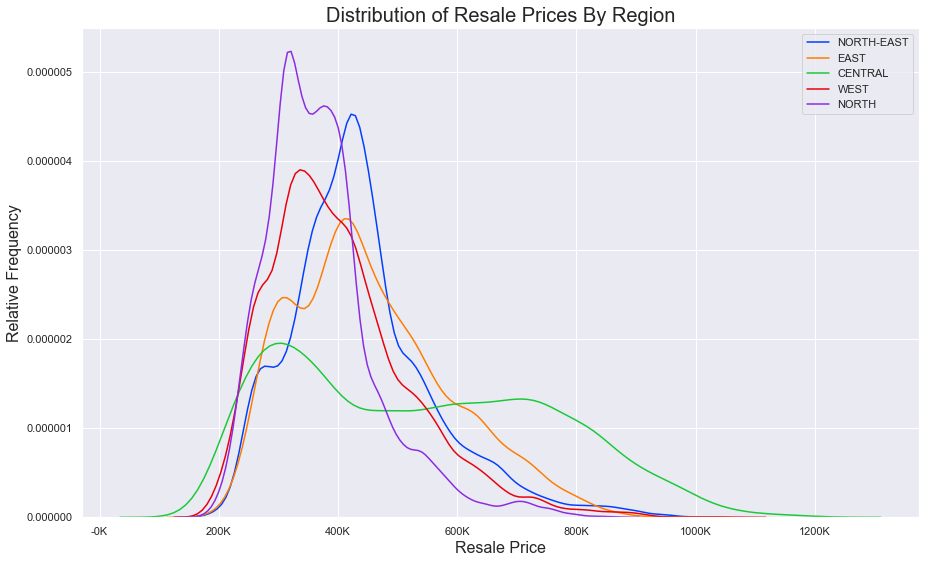

In [78]:
#Distribution of prices by histogram, by region 
fig, ax = plt.subplots(figsize = (15, 9)) 
sns.set( style = "darkgrid")

regions = df['region'].unique()
palette = itertools.cycle(sns.color_palette("bright"))
for region in regions: 
    p = sns.kdeplot(df[df['region'] == region]['resale_price'], color = next(palette))
    
plt.legend(labels = regions)
plt.xlabel("Resale Price", fontsize = 16)
plt.ylabel("Relative Frequency", fontsize = 16)
xlabels = ["{0:.0f}K".format(x) for x in p.get_xticks()//1000]
p.set_xticklabels(xlabels)
plt.title("Distribution of Resale Prices By Region", fontsize = 20)
plt.ioff()

Likewise, to normalize it from floor area factors, we can use the price per square metre in the attribute `price_per_area` to better understand the effects of regions and its distribution on prices.

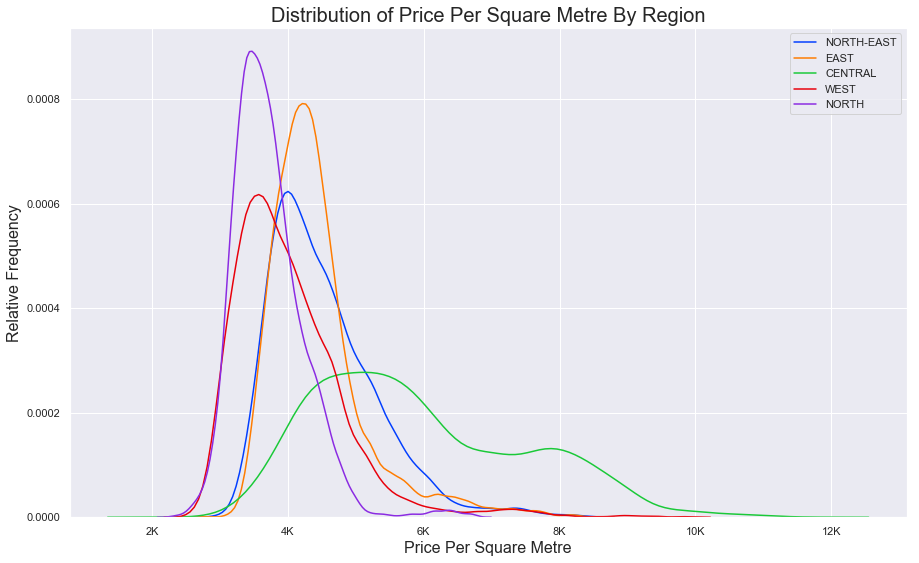

In [9]:
#Distribution of prices by histogram, by region
sns.set(style = "darkgrid")
fig, ax = plt.subplots(figsize = (15, 9)) 
sns.set( style = "darkgrid")

regions = df['region'].unique()
palette = itertools.cycle(sns.color_palette("bright"))
for region in regions: 
    p = sns.kdeplot(df[df['region'] == region]['price_per_area'], color = next(palette))
    
plt.legend(labels = regions)
plt.xlabel("Price Per Square Metre", fontsize = 16)
plt.ylabel("Relative Frequency", fontsize = 16)
xlabels = ["{0:.0f}K".format(x) for x in p.get_xticks()//1000]
p.set_xticklabels(xlabels)
plt.title("Distribution of Price Per Square Metre By Region", fontsize = 20)
plt.ioff()

## 3.8 Analysis of Distribution of Prices, by Floor Level

We can also see if the floor level of the flat affects it's price. Accounting for the effect of the `region` on resale price as we have explored above, and normalizing for `floor area`, we observe that there is a positive relationship between the mean storey level and the resale price.

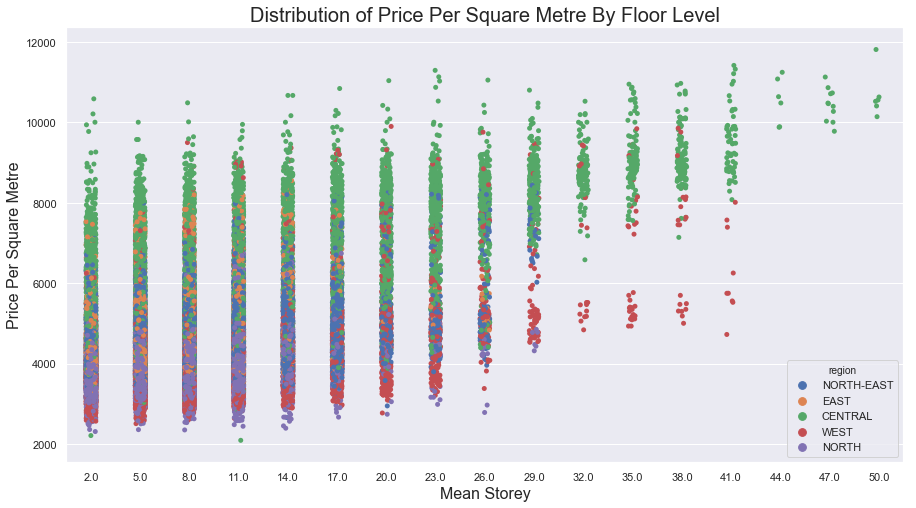

In [15]:
#Distribution of resale price by story range
fig = plt.figure(figsize = (15, 8)) 
sns.set(style = "darkgrid")

p = sns.stripplot(x = "mean_storey_range", y = "price_per_area", hue  = "region", data = df)
plt.xlabel("Mean Storey", fontsize = 16)
plt.ylabel("Price Per Square Metre", fontsize = 16)
plt.title("Distribution of Price Per Square Metre By Floor Level", fontsize = 20)
plt.ioff()

## 3.9 Analysis of Distribution of Prices, by Flat Model

We can likewise observe the distribution of prices by the flat model. The **Type S2** fetches the highest median price, likely due to its higher floor area and better design. The **Improved** type has a relatively low median price, but also has the largest range of values due to it being one the most prevelant of HDB's designs (25% of all flats are the **Improved** models).

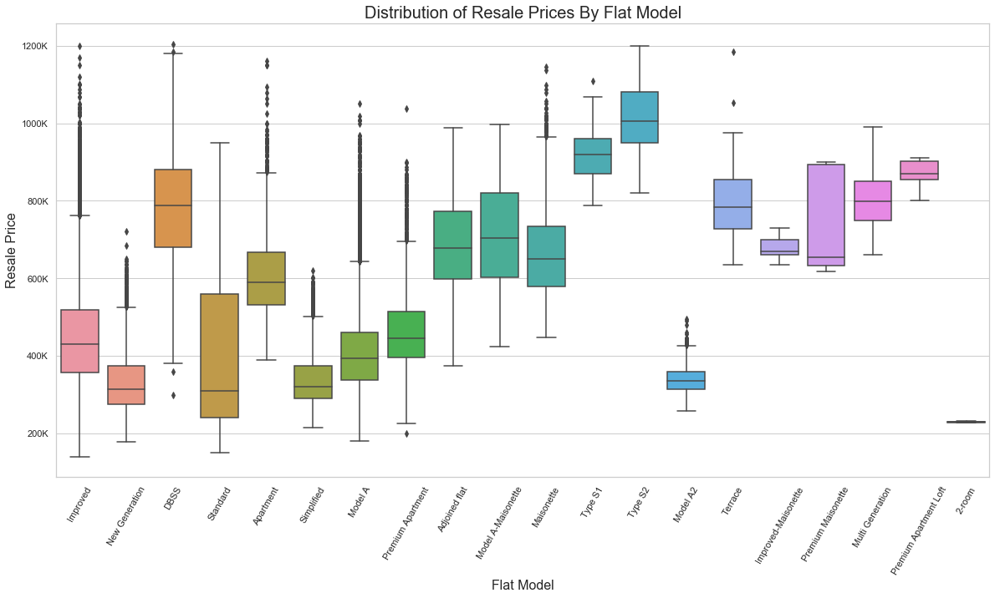

In [108]:
#Distribution of prices by histogram, by flat model 
fig = plt.figure(figsize = (20, 10)) 
sns.set( style = "whitegrid")
flat_models = df['flat_model'].unique()

p = sns.boxplot("flat_model", 'resale_price', data = df)
plt.xlabel("Flat Model", fontsize = 16)
plt.ylabel("Resale Price", fontsize = 16)
ylabels = ["{0:.0f}K".format(y) for y in p.get_yticks()//1000]
p.set_yticklabels(ylabels)
p.set_xticklabels(p.get_xticklabels(), rotation = 60)
plt.title("Distribution of Resale Prices By Flat Model", fontsize = 20)
plt.ioff()

The relative proportions of flat models can be visualized with a pie chart.

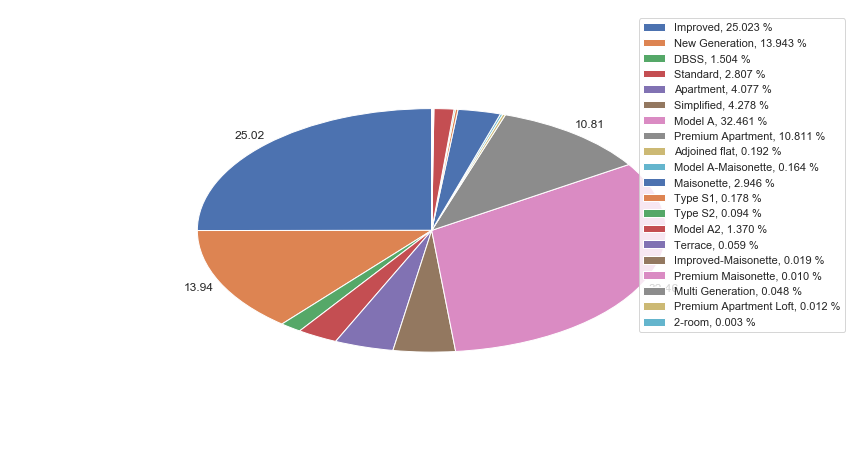

In [90]:
fig = plt.figure(figsize = (15, 8)) 
models = df['flat_model'].unique()
model_numbers = []
#Only show percentages if beyond a certain percentage
def autopct(pct):
    return ('%.2f' % pct) if pct > 10 else ''

denom = len(df)
for model in models:
    model_numbers.append(len(df[df['flat_model'] == model])/denom *100)
    
w, t, a = plt.pie(model_numbers, autopct= autopct, pctdistance=1.1, startangle = 90, radius = 0.7)
plt.legend(w, models, title = "Flat Models", bbox_to_anchor=(1, 0, 0.5, 1))
plt.legend(labels= ['%s, %1.3f %%' % (l, s) for l, s in zip(models, model_numbers)])
plt.ioff()

We can also better understand the impact on valuation by normalizing the price based on its floor area to better understand how `flat_model` itself contributes to prices, that is, to get the price per square metre. After normalizing for floor area, we observe that it is **Type S1** that has the highest median value per square metre. For most models from **Improved** to **Maisonette**, their prices per square metre is roughly the same, with the exception to **DBSS**, implying that the variation we see above is due more to floor area differences for these models. 

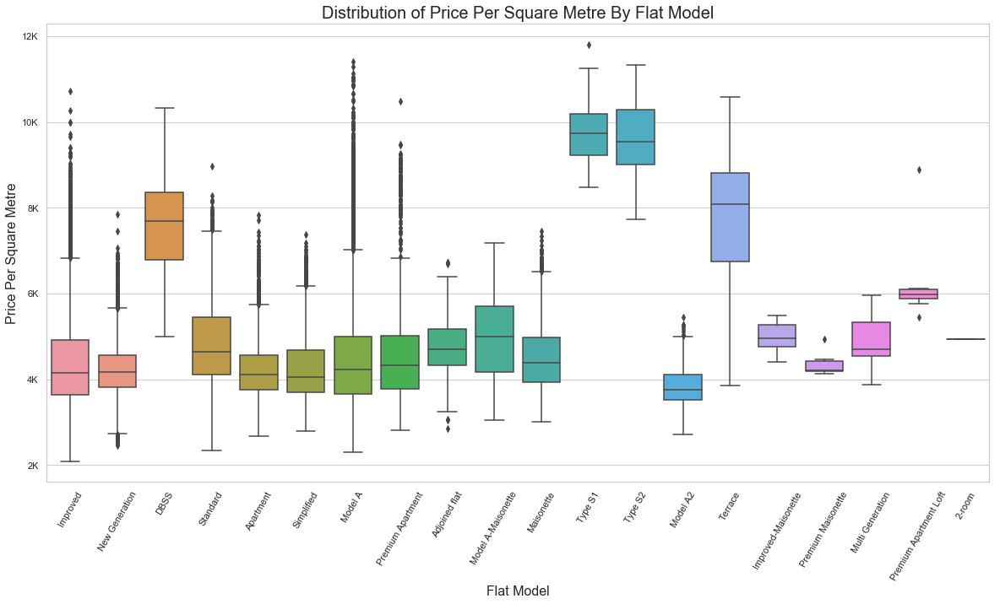

In [109]:
#Distribution of prices by histogram, by flat model 
fig = plt.figure(figsize = (20, 10)) 
sns.set( style = "whitegrid")
flat_models = df['flat_model'].unique()

p = sns.boxplot("flat_model", 'price_per_area', data = df)
plt.xlabel("Flat Model", fontsize = 16)
plt.ylabel("Price Per Square Metre", fontsize = 16)
ylabels = ["{0:.0f}K".format(y) for y in p.get_yticks()//1000]
p.set_yticklabels(ylabels)
p.set_xticklabels(p.get_xticklabels(), rotation = 60)
plt.title("Distribution of Price Per Square Metre By Flat Model", fontsize = 20)
plt.ioff()

## 3.10 Analysis of Distribution of Prices, by Flat Type (Number of Rooms)

We can also visualize how the `flat type` or number of rooms affect the price distribution. As expected, a higher number of rooms implies more floor area and hence, a higher resale price. The **Multi-Generation** flat type fetches the highest resale price across all categories.

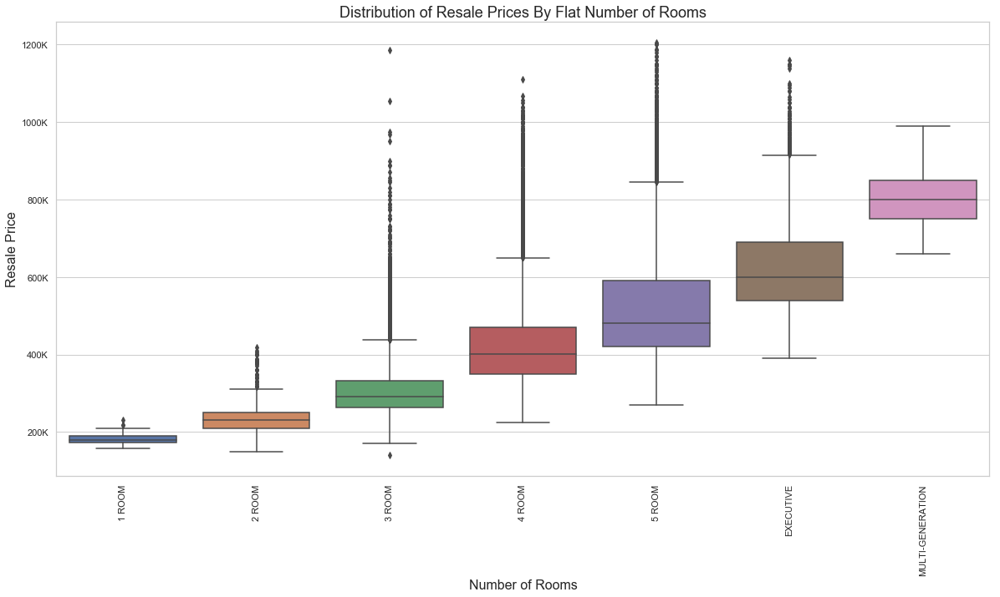

In [7]:
#Distribution of prices by histogram, by number of rooms 
fig = plt.figure(figsize = (20, 10)) 
sns.set( style = "whitegrid")

#uncomment this segment to do a ordered list by median
# dfSort = df.filter(["resale_price", "flat_type"])
# dfSort = dfSort.groupby(["flat_type"])
# df2 = pd.DataFrame({col:vals["resale_price"] for col, vals in dfSort})
# meds = df2.median()
# meds.sort_values(inplace = True)

#p = sns.boxplot("flat_type", 'resale_price', data = df, order = meds.index)

#Specifying one own's custom order
order = list(df["flat_type"].unique()) 
order.remove("1 ROOM")
order.insert(0, "1 ROOM")

p = sns.boxplot("flat_type", 'resale_price', data = df, order = order)

plt.xlabel("Number of Rooms",  fontsize = 16)
plt.ylabel("Resale Price",  fontsize = 16)
p.set_xticklabels(p.get_xticklabels(), rotation = 90)
ylabels = ["{0:.0f}K".format(y) for y in p.get_yticks()//1000]
p.set_yticklabels(ylabels)
plt.title("Distribution of Resale Prices By Flat Number of Rooms", fontsize = 18)
plt.ioff()

Likewise, by normalizing for floor area, we note that the price per square metre has roughly the same median values. Interestingly, the **2-room** and **1-room** flats have a higher per square metre cost. This may be due to concepts similar to *economies of scale* and *marginal costs* during construction. 

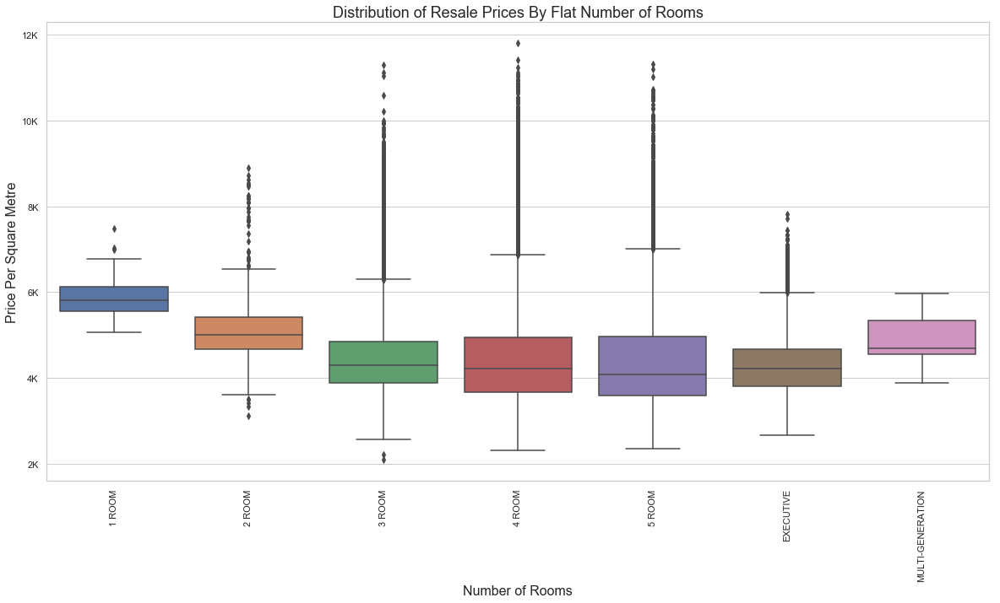

In [8]:
#Distribution of prices by histogram, by number of rooms 
fig = plt.figure(figsize = (20, 10)) 
sns.set( style = "whitegrid")
flat_models = df['flat_type'].unique()

p = sns.boxplot("flat_type", 'price_per_area', data = df, order = order)

plt.xlabel("Number of Rooms",  fontsize = 16)
plt.ylabel("Price Per Square Metre",  fontsize = 16)
p.set_xticklabels(p.get_xticklabels(), rotation = 90)
ylabels = ["{0:.0f}K".format(y) for y in p.get_yticks()//1000]
p.set_yticklabels(ylabels)
plt.title("Distribution of Resale Prices By Flat Number of Rooms", fontsize = 18)
plt.ioff()

## 3.11 Analysis of Block Number on Resale Prices

We can do an analysis using `scatterplot` on the relationship between `resale_price` (or `price_per_area`) and `block_number`. There is an apparent trend for lower block numbers to fetch on average higher resale prices. Since this may be affected by the relationship between region and floor area, we have also normalized the prices for floor area. This relationship is even stronger when normalized for floor area. We observe that the **Central** region accounts for most of the small block numbers, while block numbers for the rest of the regions are more evenly spread out (see *Section 5.1*)

Pearson Coefficient For Resale Price: -0.124


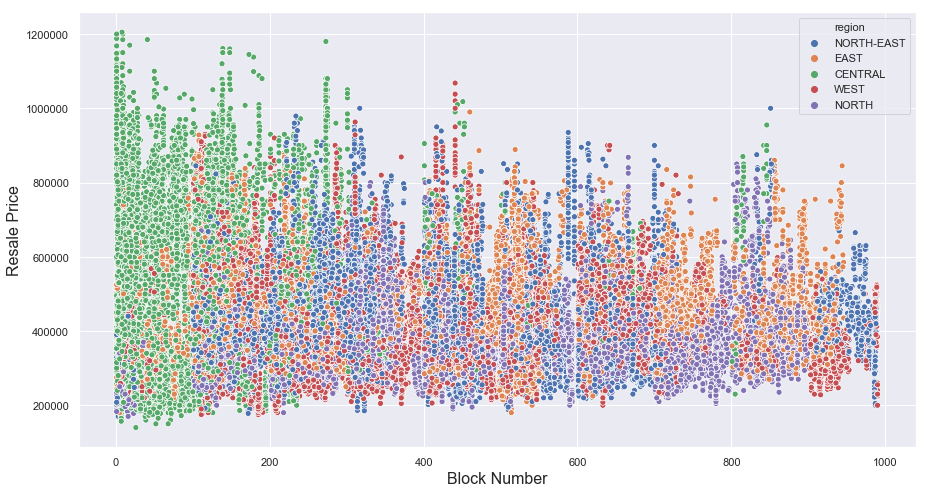

In [23]:
sns.scatterplot(x = "block_number", y = "resale_price", hue = "region", data = df)

plt.xlabel("Block Number",  fontsize = 16)
plt.ylabel("Resale Price",  fontsize = 16)
plt.ioff()


r = pearsonr(df['block_number'].values, df['resale_price'].values)
print("Pearson Coefficient For Resale Price: " + str(round(r[0],3)))

Pearson Coefficient For Price Per Square Metre: -0.339


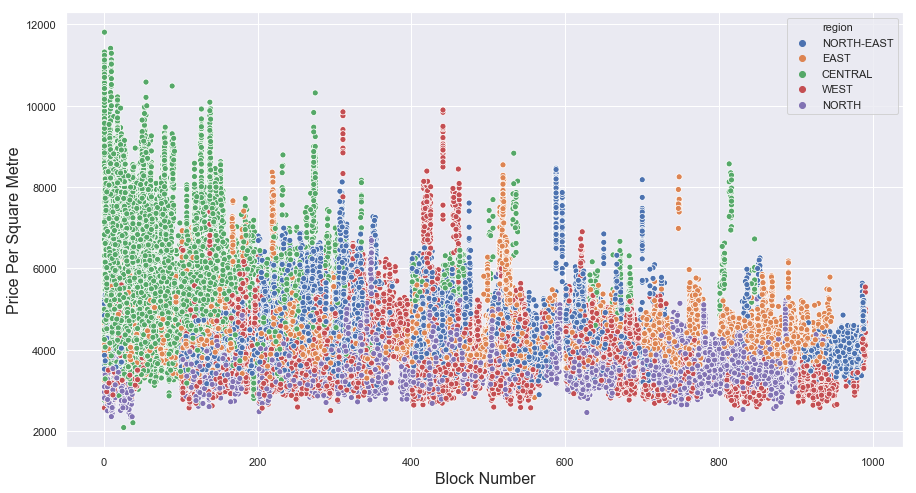

In [24]:
plt.figure(figsize = (15, 8)) 
sns.scatterplot(x = "block_number", y = "price_per_area", hue = "region", data = df)

plt.xlabel("Block Number",  fontsize = 16)
plt.ylabel("Price Per Square Metre",  fontsize = 16)
plt.ioff()

r = pearsonr(df['block_number'].values, df['price_per_area'].values)
print("Pearson Coefficient For Price Per Square Metre: " + str(round(r[0],3)))

## 3.12 Analysis of Remaining Lease on Resale Prices

Likewise, a `jointplot` is used to analyse the relationship between `resale_price` and `months_remaining_lease`. As expected, the longer the remaining lease, the higher price it is able to command. When normalized for floor area, the positive correlation still holds but sees a significant decline in magnitude.

Pearson Coefficient For Resale Price: 0.325
Slope of Regression Line, Resale Price: 331.882
Pearson Coefficient For Price Per Square Metre: 0.258
Slope of Regression Line, Price Per Square Metre: 2.07


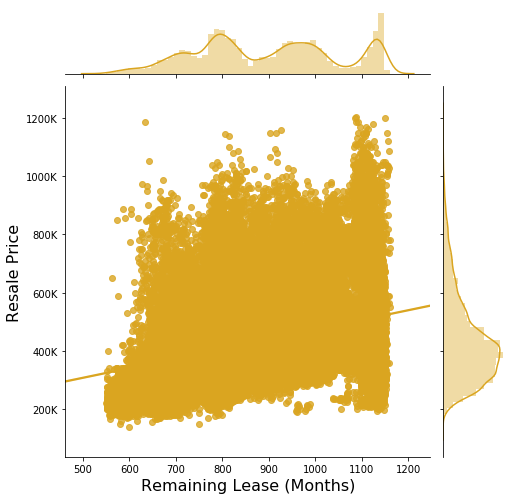

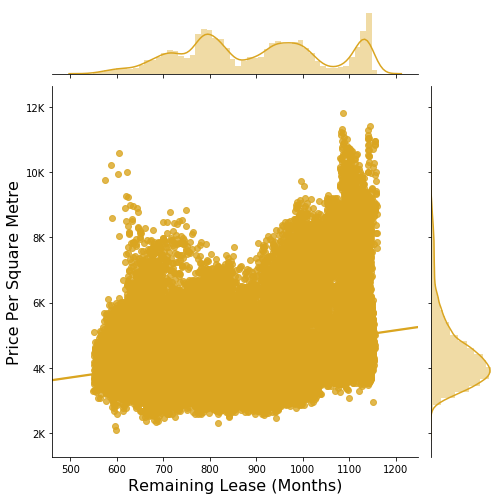

In [20]:
p = sns.jointplot(x = 'months_remaining_lease', y = 'resale_price', data = df, kind = "reg", color = "goldenrod", height = 7)

plt.xlabel("Remaining Lease (Months)",  fontsize = 16)
plt.ylabel("Resale Price",  fontsize = 16)
ylabels = ["{0:.0f}K".format(y) for y in p.ax_joint.get_yticks()//1000]
p.ax_joint.set_yticklabels(ylabels)
plt.ioff()

p = sns.jointplot(x = 'months_remaining_lease', y = 'price_per_area', data = df, kind = "reg", color = "goldenrod", height = 7)

plt.xlabel("Remaining Lease (Months)",  fontsize = 16)
plt.ylabel("Price Per Square Metre",  fontsize = 16)
ylabels = ["{0:.0f}K".format(y) for y in p.ax_joint.get_yticks()//1000]
p.ax_joint.set_yticklabels(ylabels)
plt.ioff()

r = pearsonr(df['months_remaining_lease'].values, df['resale_price'].values)
regress = linregress(df['months_remaining_lease'].values, df['resale_price'].values)
print("Pearson Coefficient For Resale Price: " + str(round(r[0],3)))
print("Slope of Regression Line, Resale Price: "  +str(round(regress[0], 3)))

r = pearsonr(df['months_remaining_lease'].values, df['price_per_area'].values)
regress = linregress(df['months_remaining_lease'].values, df['price_per_area'].values)
print("Pearson Coefficient For Price Per Square Metre: " + str(round(r[0],3)))
print("Slope of Regression Line, Price Per Square Metre: "  +str(round(regress[0], 3)))

## 3.13 Analysis of Distance to MRT on Resale Prices

Likewise, a `jointplot` is used to analyse the relationship between `resale_price` and `neartest_mrt_dist`. As expected, the smaller the distance from the nearest MRT, the higher resale price it is able to command. This negative correlation is stronger when normalized for floor area.

Pearson Coefficient For Resale Price: -0.12
Slope of Regression Line, Resale Price: -34108.039
Pearson Coefficient For Price Per Square Metre: -0.185
Slope of Regression Line, Per Square Metre: -413.0


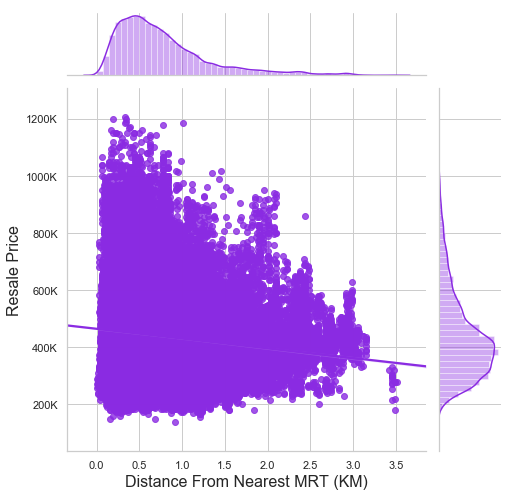

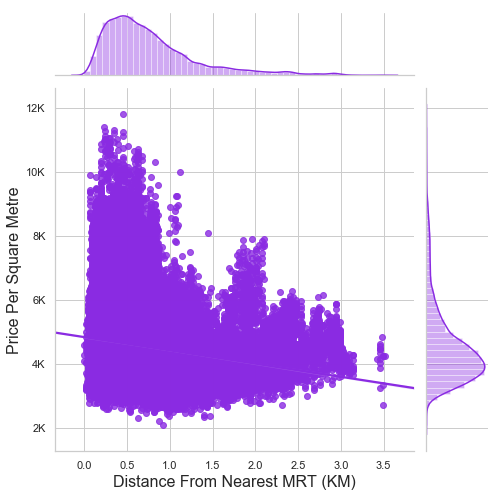

In [10]:
p = sns.jointplot(x = 'dist_to_mrt', y = 'resale_price', data = df, kind = "reg", color = "blueviolet", height = 7)

plt.xlabel("Distance From Nearest MRT (KM)",  fontsize = 16)
plt.ylabel("Resale Price",  fontsize = 16)
ylabels = ["{0:.0f}K".format(y) for y in p.ax_joint.get_yticks()//1000]
p.ax_joint.set_yticklabels(ylabels)
plt.ioff()

p = sns.jointplot(x = 'dist_to_mrt', y = 'price_per_area', data = df, kind = "reg", color = "blueviolet", height = 7)

plt.xlabel("Distance From Nearest MRT (KM)",  fontsize = 16)
plt.ylabel("Price Per Square Metre",  fontsize = 16)
ylabels = ["{0:.0f}K".format(y) for y in p.ax_joint.get_yticks()//1000]
p.ax_joint.set_yticklabels(ylabels)
plt.ioff()

r = pearsonr(df['dist_to_mrt'].values, df['resale_price'].values)
regress = linregress(df['dist_to_mrt'].values, df['resale_price'].values)

print("Pearson Coefficient For Resale Price: " + str(round(r[0],3)))
print("Slope of Regression Line, Resale Price: "  +str(round(regress[0], 3)))

r = pearsonr(df['dist_to_mrt'].values, df['price_per_area'].values)
regress = linregress(df['dist_to_mrt'].values, df['price_per_area'].values)
print("Pearson Coefficient For Price Per Square Metre: " + str(round(r[0],3)))
print("Slope of Regression Line, Per Square Metre: "  +str(round(regress[0], 3)))

## 3.14 Analysis of Distance to School on Resale Prices

Likewise, a `jointplot` is used to analyse the relationship between `resale_price` and `dist_to_sch`. As expected, the smaller the distance from the nearest school, the higher resale price it is able to command. However, this relationship seems to be weak. When normalized for floor area however, this relationship becomes 4 times stronger. This implies that there may be some effect on distance to schools on the intrinsic value of each metre of land, but mitigated due to different land sizes across different areas. It is also surprising to note that most of HDB's buildings are normally distributed in terms of its distance to the nearest school, with almost all HDB's being within 1KM of a school. This may be an intentional design which we will explore more in our report.

Pearson Coefficient For Resale Price: 0.042
Slope of Regression Line, Resale Price: 36145.826
Pearson Coefficient For Price Per Square Metre: 0.168
Slope of Regression Line, Price Per Square Metre: 1127.164


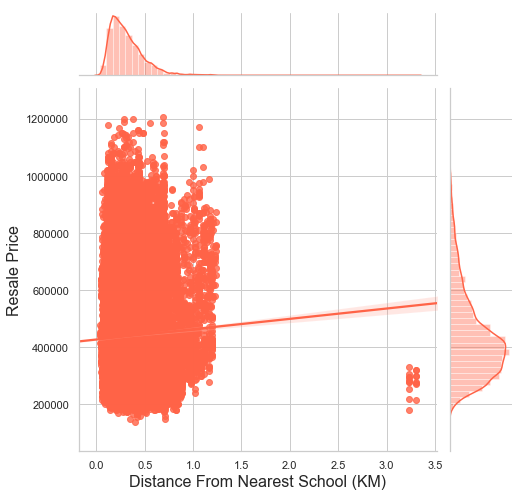

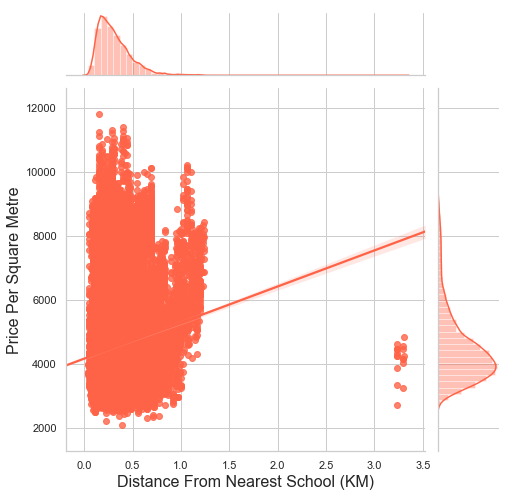

In [13]:
sns.jointplot(x = 'dist_to_sch', y = 'resale_price', data = df, kind = "reg", color = "tomato", height = 7)

plt.xlabel("Distance From Nearest School (KM)",  fontsize = 16)
plt.ylabel("Resale Price",  fontsize = 16)
plt.ioff()

sns.jointplot(x = 'dist_to_sch', y = 'price_per_area', data = df, kind = "reg", color = "tomato", height = 7)

plt.xlabel("Distance From Nearest School (KM)",  fontsize = 16)
plt.ylabel("Price Per Square Metre",  fontsize = 16)
plt.ioff()

r = pearsonr(df['dist_to_sch'].values, df['resale_price'].values)
regress = linregress(df['dist_to_sch'].values, df['resale_price'].values)
print("Pearson Coefficient For Resale Price: " + str(round(r[0],3)))
print("Slope of Regression Line, Resale Price: "  +str(round(regress[0], 3)))

r = pearsonr(df['dist_to_sch'].values, df['price_per_area'].values)
regress = linregress(df['dist_to_sch'].values, df['price_per_area'].values)
print("Pearson Coefficient For Price Per Square Metre: " + str(round(r[0],3)))
print("Slope of Regression Line, Price Per Square Metre: "  +str(round(regress[0], 3)))

We note that there are points which are significantly further away, which belongs to the stretch of properties along Changi Village Road, which are indeed more secluded from schools or MRTs. When removed, the correlation coefficient improves slightly. 

In [14]:
tempdf = df[df["dist_to_sch"] < 3]

r = pearsonr(tempdf['dist_to_sch'].values, tempdf['price_per_area'].values)
print("Pearson Coefficient: " + str(round(r[0],3)))
df[df["dist_to_sch"] > 3]

Pearson Coefficient: 0.175


,month,town,flat_type,block,street_name,floor_area_sqm,flat_model,lease_commence_date,resale_price,months_remaining_lease,...,nearest_mrt_lng,dist_to_mrt,nearest_mall,nearest_mall_lat,nearest_mall_lng,dist_to_mall,nearest_sch,nearest_sch_lat,nearest_sch_lng,dist_to_sch
666,2017-01,PASIR RIS,3 ROOM,5,CHANGI VILLAGE RD,66.0,Improved,1981,286000.0,762,...,103.988487,3.460655,Jewel Changi Airport,1.360332,103.98967,3.169403,PASIR RIS PRIMARY SCHOOL,1.372309,103.962919,3.230676
5124,2017-04,PASIR RIS,3 ROOM,4,CHANGI VILLAGE RD,66.0,Improved,1980,320000.0,747,...,103.988487,3.484562,Jewel Changi Airport,1.360332,103.98967,3.190118,PASIR RIS PRIMARY SCHOOL,1.372309,103.962919,3.302507
8846,2017-06,PASIR RIS,3 ROOM,1,CHANGI VILLAGE RD,77.0,Improved,1980,320000.0,745,...,103.988487,3.422746,Jewel Changi Airport,1.360332,103.98967,3.126753,PASIR RIS PRIMARY SCHOOL,1.372309,103.962919,3.300565
10548,2017-07,PASIR RIS,3 ROOM,5,CHANGI VILLAGE RD,66.0,Improved,1981,295000.0,756,...,103.988487,3.460655,Jewel Changi Airport,1.360332,103.98967,3.169403,PASIR RIS PRIMARY SCHOOL,1.372309,103.962919,3.230676
12437,2017-08,PASIR RIS,3 ROOM,5,CHANGI VILLAGE RD,66.0,Improved,1981,255000.0,756,...,103.988487,3.460655,Jewel Changi Airport,1.360332,103.98967,3.169403,PASIR RIS PRIMARY SCHOOL,1.372309,103.962919,3.230676
14216,2017-09,PASIR RIS,3 ROOM,5,CHANGI VILLAGE RD,66.0,Improved,1981,305000.0,754,...,103.988487,3.460655,Jewel Changi Airport,1.360332,103.98967,3.169403,PASIR RIS PRIMARY SCHOOL,1.372309,103.962919,3.230676
20894,2018-01,PASIR RIS,3 ROOM,5,CHANGI VILLAGE RD,66.0,Improved,1981,295000.0,750,...,103.988487,3.460655,Jewel Changi Airport,1.360332,103.98967,3.169403,PASIR RIS PRIMARY SCHOOL,1.372309,103.962919,3.230676
22016,2018-02,PASIR RIS,3 ROOM,5,CHANGI VILLAGE RD,74.0,Improved,1981,330000.0,749,...,103.988487,3.460655,Jewel Changi Airport,1.360332,103.98967,3.169403,PASIR RIS PRIMARY SCHOOL,1.372309,103.962919,3.230676
31347,2018-07,PASIR RIS,3 ROOM,5,CHANGI VILLAGE RD,66.0,Improved,1981,280000.0,745,...,103.988321,3.491268,Jewel Changi Airport,1.360332,103.98967,3.169403,PASIR RIS PRIMARY SCHOOL,1.372309,103.962919,3.230676
31348,2018-07,PASIR RIS,3 ROOM,1,CHANGI VILLAGE RD,66.0,Improved,1980,300000.0,732,...,103.988321,3.453956,Jewel Changi Airport,1.360332,103.98967,3.126753,PASIR RIS PRIMARY SCHOOL,1.372309,103.962919,3.300565


## 3.15 Analysis of Distance to Malls on Resale Prices

Likewise, a `jointplot` is used to analyse the relationship between `resale_price` and `dist_to_mall`. As expected, the smaller the distance from the nearest mall, the higher resale price it is able to command. This relationship however is extremely weak. There is also no significant difference in the change in correlation coefficient after normalizing for floor area. It is interesting to note again that the distances of HDBs to the nearest malls are normally distributed, with most within 1.5KM. This may be a strategic design and allocation by mall construction companies to attract the most volume to their malls.

Pearson Coefficient For Resale Price: -0.079
Slope of Regression Line, Resale Price: -33109.038
Pearson Coefficient For Price Per Square Metre: -0.041
Slope of Regression Line, Price Per Square Metre: -133.542


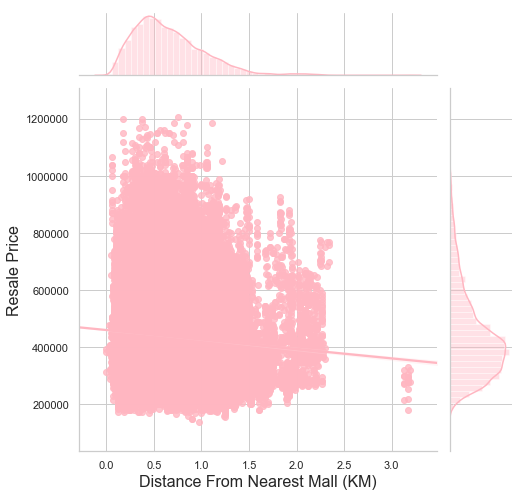

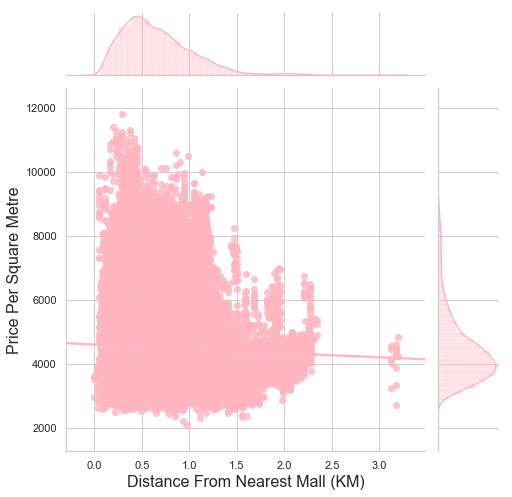

In [12]:
sns.jointplot(x = 'dist_to_mall', y = 'resale_price', data = df, kind = "reg", color = "lightpink", height = 7)

plt.xlabel("Distance From Nearest Mall (KM)",  fontsize = 16)
plt.ylabel("Resale Price",  fontsize = 16)
plt.ioff()

sns.jointplot(x = 'dist_to_mall', y = 'price_per_area', data = df, kind = "reg", color = "lightpink", height = 7)

plt.xlabel("Distance From Nearest Mall (KM)",  fontsize = 16)
plt.ylabel("Price Per Square Metre",  fontsize = 16)
plt.ioff()

r = pearsonr(df['dist_to_mall'].values, df['resale_price'].values)
regress = linregress(df['dist_to_mall'].values, df['resale_price'].values)
print("Pearson Coefficient For Resale Price: " + str(round(r[0],3)))
print("Slope of Regression Line, Resale Price: "  +str(round(regress[0], 3)))

r = pearsonr(df['dist_to_mall'].values, df['price_per_area'].values)
regress = linregress(df['dist_to_mall'].values, df['price_per_area'].values)
print("Pearson Coefficient For Price Per Square Metre: " + str(round(r[0],3)))
print("Slope of Regression Line, Price Per Square Metre: "  +str(round(regress[0], 3)))

Removing the outliers, which are the same set of building seen above, there is no significant change to the correlation coefficient either. We will hence not proceed to remove these "outliers". 

In [117]:
tempdf = df[df["dist_to_mall"] < 3]

r = pearsonr(tempdf['dist_to_mall'].values, tempdf['resale_price'].values)
print("Pearson Coefficient: " + str(round(r[0],3)))

Pearson Coefficient: -0.078


# 4. Summary Visualizations

## 4.1 Pairplot Visualization

We use a pairplot here to visualise any relationship between any 2 variables in our dataset to get a better understanding of the relationships here.

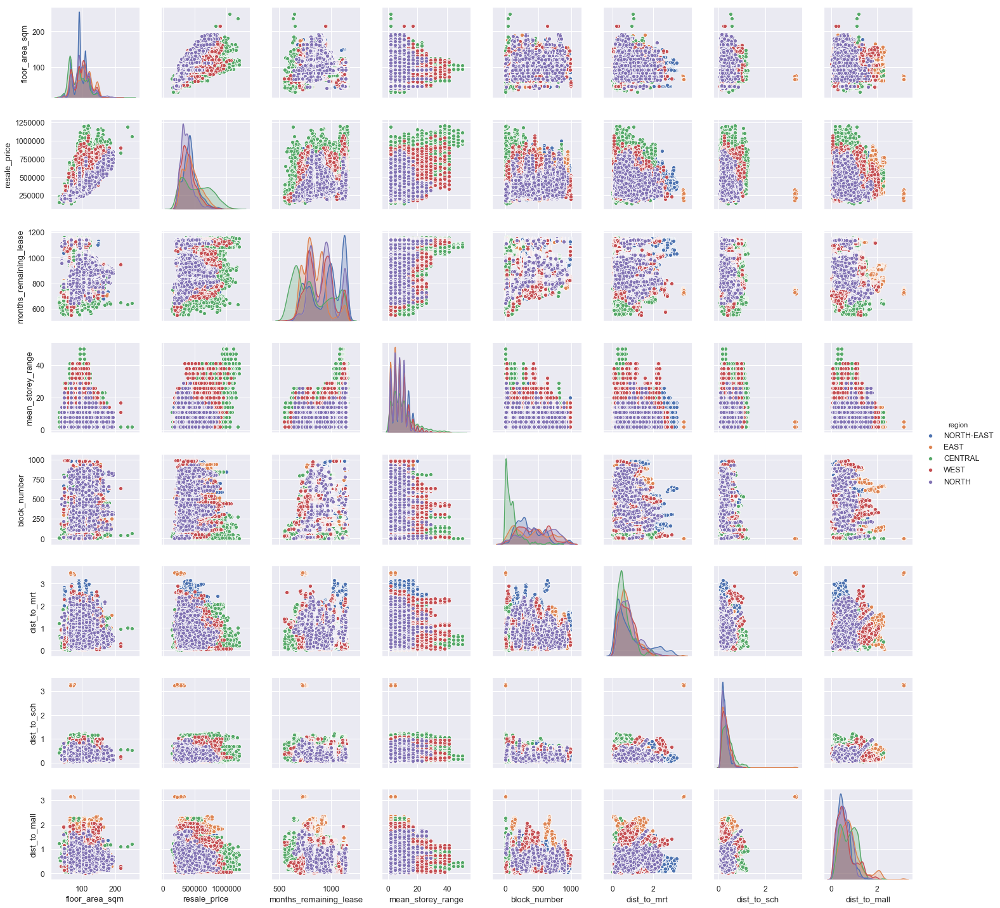

In [39]:
#Pairplot
pairplotdf = df.drop(['hdb_lat', 'hdb_lng', "nearest_mrt_lat", "nearest_mrt_lng", "nearest_mall_lat", "nearest_mall_lng",
                 "nearest_sch_lat", "nearest_sch_lng"], axis = 1) #Remove coordinate data
#Pairplot takes some time to plot, remove unncessary datafields to improve performance
p = sns.pairplot(pairplotdf, vars = ['floor_area_sqm', 'resale_price', 'months_remaining_lease', 'mean_storey_range', 'block_number', 'dist_to_mrt', "dist_to_sch", "dist_to_mall"], hue = "region", diag_kind = "kde")
sns.set(font_scale = 1.2)

## 4.2 Correlation HeatMap

[]

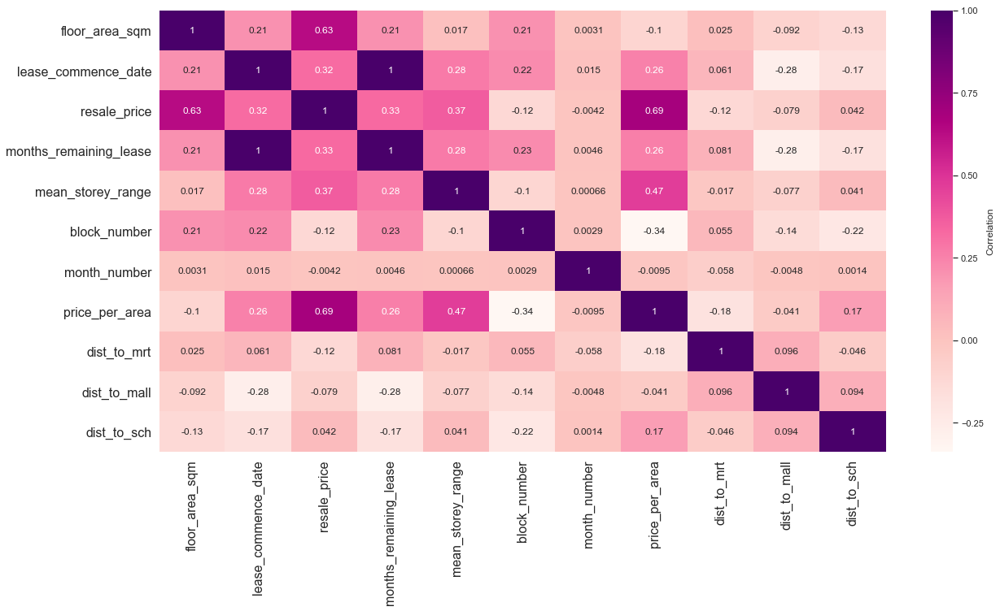

In [128]:
#Correlation Heatmap 
corrDF = df.drop(['hdb_lat', 'hdb_lng', "nearest_mrt_lat", "nearest_mrt_lng", "nearest_mall_lat", "nearest_mall_lng",
                 "nearest_sch_lat", "nearest_sch_lng"], axis = 1) #Remove coordinate data
corrM = corrDF.corr()
fig = plt.figure(figsize = (20, 10))
corr_p = sns.heatmap(corrM, annot = True, cbar_kws = {'label' : 'Correlation'}, cmap = "RdPu") #"region",
corr_p.set_xticklabels(corr_p.get_xmajorticklabels(), fontsize = 16)
corr_p.set_yticklabels(corr_p.get_ymajorticklabels(), fontsize = 16)
plt.plot()

# 5. Investigating Relationships Between Attributes

From the Correlation Heatmap in *Section 4.2*, we note that there are some moderate correlations between attributes which are correlated to the `resale price`. To avoid the problem of colinearity in our multiple regression model, we should investigate the relationship between attributes to take note for when constructing our model in subsequent sections.

Some relationships are expected and easily explained. For instance, `floor_area_sqm` is positively linearly correlated with `resale_price` as buyers are expected to pay more for more floor area, *certeris paribus*. There is also a strong linear correlation between `resale_price` and `months_remaining_lease`, as expected due to HDB's 99-year lease policy. Hence, the longer the unit is available before being taken back by HDB, the higher it is valued. Also noted that `months_remaining_lease` is derived from `remaining_lease` and `lease_commence_date`, the correlation is a perfect linear positive relationship. 

There is also a non-trivial relationship between `months_remaining_lease` and `mean_storey_range` due to HDB buildings being built higher due to space constraint in recent years as compared to in the 1950s, as seen in HDB's earlier projects, which included landed properties. 

Relationships between certain attributes is investigated below.

## 5.1 Relationship Between Block Number and Region

Clearly, lower block numbers are found in disproportionately high frequencies in the **Central** region, which may acccount for the higher prices in lower block numbers, as visualized in *Section 3.12*. This can be explained by HDB's numbering policy, where the first digit in HDB's "3-digit numbering system" denotes the neighbourhood, while 2-digits usually denotes a Central area.

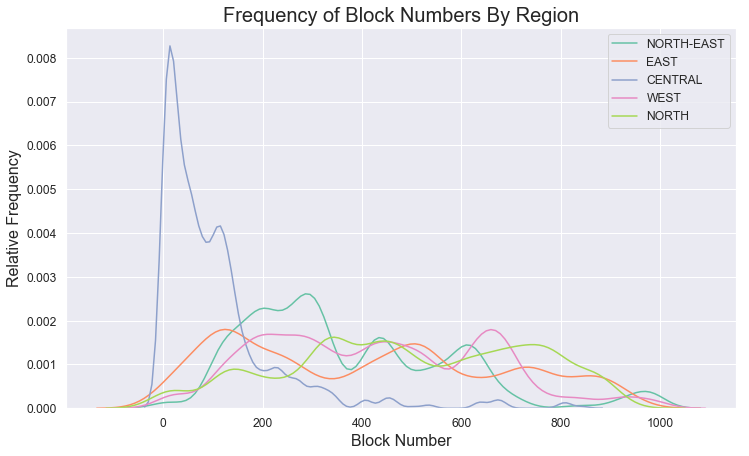

In [9]:
fig = plt.figure(figsize = (12, 7))

regions = df['region'].unique()
palette = itertools.cycle(sns.color_palette("Set2"))
for region in regions: 
    p = sns.kdeplot(df[df['region'] == region]['block_number'], color = next(palette))
plt.legend(labels = regions)
plt.xlabel("Block Number", fontsize = 16)
plt.ylabel("Relative Frequency", fontsize = 16)
plt.title("Frequency of Block Numbers By Region", fontsize = 20)
plt.ioff()

## 5.2 Relationship Between Months Remaining Lease and Floor Area

There is a slight correlation between `months_remaining_lease` and `floor_area_sqm` for reasons explained above, pertaining to the time period at which the HDB project was initiated. As HDB projects gradually get smaller in floor area due to increasing space constraint, this relationship is expected.

Pearson Coefficient: 0.209


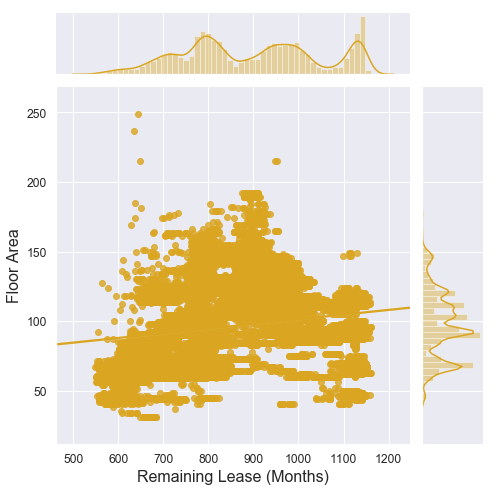

In [19]:
sns.jointplot(x = "months_remaining_lease", y = 'floor_area_sqm', data = df, kind = "reg", color = "goldenrod", height = 7)

plt.xlabel("Remaining Lease (Months)",  fontsize = 16)
plt.ylabel("Floor Area",  fontsize = 16)
plt.ioff()

r = pearsonr(df['months_remaining_lease'].values, df['floor_area_sqm'].values)
print("Pearson Coefficient: " + str(round(r[0],3)))

## 5.3 Relationship Between Mean Storey Level and Months Remaining Lease

Generally, for the older flats (that is, those with lower remaining lease), their floor levels are lower. For storey levels beyond 25, it is observed that they have longer remaining leases. This is due to these high-rise HDBs being only recently built, for instance *Pinnacle @ Duxton* having 50 storeys.

Pearson Coefficient: 0.278


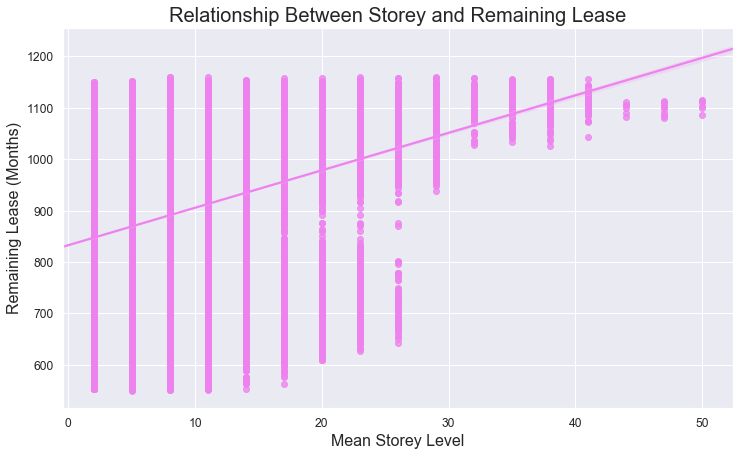

In [21]:
fig = plt.figure(figsize = (12, 7))

reg_plot = sns.regplot(x = "mean_storey_range", y = 'months_remaining_lease', data = df, color = "violet")

plt.xlabel("Mean Storey Level", fontsize = 16)
plt.ylabel("Remaining Lease (Months)", fontsize = 16)
plt.title("Relationship Between Storey and Remaining Lease", fontsize = 20)
plt.ioff()

r = pearsonr(df['months_remaining_lease'].values, df['mean_storey_range'].values)
print("Pearson Coefficient: " + str(round(r[0],3)))

## 5.4 Relationship Between Flat Type and Floor Area

As expected, the flat type, that is, the number of rooms have a clear positive relationship with the floor area. Interestingly however, the highest floor areas came from a 3 room flat. We note that this plot also resembles the plot in *Section 3.10* where the Y-axis was resale price instead of floor area. This suggests the possibility that floor area is the main determining factor of prices rather than the type.

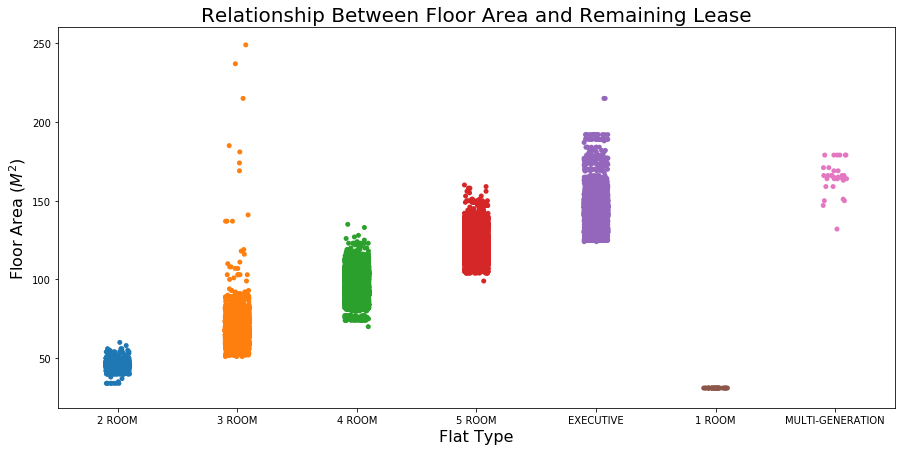

In [3]:
fig = plt.figure(figsize = (15, 7))

sns.stripplot(x = "flat_type", y = "floor_area_sqm", data = df)

plt.xlabel("Flat Type", fontsize = 16)
plt.ylabel("Floor Area ($M^{2}$)", fontsize = 16)
plt.title("Relationship Between Floor Area and Remaining Lease", fontsize = 20)
plt.ioff()

## 5.5 Relationship Between Flat Model and Floor Area

As expected, every flat model seems to have a preset range of values for floor area, with the exception to certain models such as the Terrace or Improved models. We note that this plot also resembles the plot in *Section 3.9*. where the Y-axis was resale price instead of floor area. This suggests the possibility that floor area is the main determining factor of prices rather than the model.

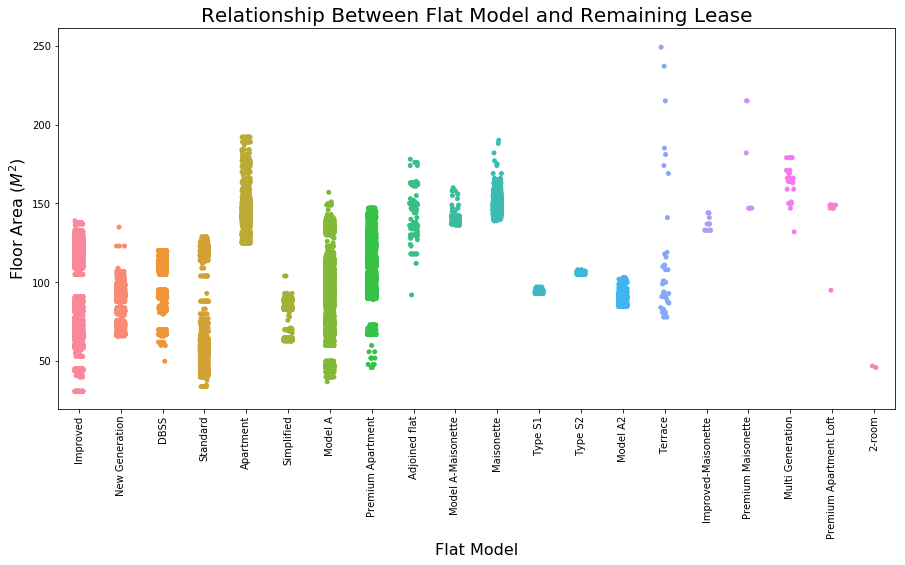

In [4]:
fig = plt.figure(figsize = (15, 7))

sns.stripplot(x = "flat_model", y = "floor_area_sqm", data = df)

plt.xlabel("Flat Model", fontsize = 16)
plt.xticks(rotation = 90)
plt.ylabel("Floor Area ($M^{2}$)", fontsize = 16)
plt.title("Relationship Between Flat Model and Remaining Lease", fontsize = 20)
plt.ioff()

# 6. Machine Learning 

With a thorough investigation on the attributes, we can now begin to construct our model. We will first begin by constructing a preliminary model using `statsmodels` and refining it using a backward stepwise selection of attributes. After which, we will use `scikit-learn`'s methods such as `train-test-split` and `cross-validation` to validate our final model which can be used in the valuation of resale flats.

## 6.1 Preliminary Model

We can construct a preliminary model based on our DataFrame, removing fields which we have used to augment our dataset, such as `lease_commence_date`,`remaining_lease`, `month` and `block`. We will also remove attributes which were used solely for visualization above, such as all `lat` and `lng`. We will however retain the `distances` attributes

In [3]:
import statsmodels.formula.api as smf
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
df = pd.read_csv("finalDataSet.csv")
df = df.drop(["lease_commence_date", "month", "block", "remaining_lease", "storey_range", "price_per_area",
             "hdb_lat", "hdb_lng", "nearestMRT", "nearest_mrt_lat", "nearest_mrt_lng", "nearest_sch", "nearest_sch_lat", "nearest_sch_lng",
             "nearest_mall", "nearest_mall_lat", "nearest_mall_lng"], axis = 1)
df.head()

,town,flat_type,street_name,floor_area_sqm,flat_model,resale_price,months_remaining_lease,region,mean_storey_range,block_number,month_number,dist_to_mrt,dist_to_mall,dist_to_sch
0,ANG MO KIO,2 ROOM,ANG MO KIO AVE 10,44.0,Improved,232000.0,736,NORTH-EAST,11.0,406,1,1.002150,0.999942,0.184711
1,ANG MO KIO,3 ROOM,ANG MO KIO AVE 4,67.0,New Generation,250000.0,727,NORTH-EAST,2.0,108,1,1.271854,0.871544,0.227334
2,ANG MO KIO,3 ROOM,ANG MO KIO AVE 5,67.0,New Generation,262000.0,749,NORTH-EAST,2.0,602,1,1.070428,1.527726,0.766132
3,ANG MO KIO,3 ROOM,ANG MO KIO AVE 10,68.0,New Generation,265000.0,745,NORTH-EAST,5.0,465,1,0.944315,1.027737,0.599476
4,ANG MO KIO,3 ROOM,ANG MO KIO AVE 5,67.0,New Generation,265000.0,749,NORTH-EAST,2.0,601,1,1.093463,1.571449,0.788978


In [42]:
#preliminary ML plot 
attr = df.columns.drop(["resale_price", "town", "flat_type", "flat_model", "region"]) ##Added as categorical var
modeleq = 'resale_price' + " ~ " + "C(street_name) + C(town) + C(flat_type) + C(flat_model) + C(region) + " + " + ".join(attr)
mod = smf.ols(modeleq, df).fit()
print(mod.summary2(),'\n')

                                     Results: Ordinary least squares
Model:                          OLS                          Adj. R-squared:                 0.935       
Dependent Variable:             resale_price                 AIC:                            1635781.9548
Date:                           2020-05-07 12:12             BIC:                            1641022.3611
No. Observations:               68161                        Log-Likelihood:                 -8.1732e+05 
Df Model:                       573                          F-statistic:                    1705.       
Df Residuals:                   67587                        Prob (F-statistic):             0.00        
R-squared:                      0.935                        Scale:                          1.5361e+09  
---------------------------------------------------------------------------------------------------------
                                           Coef.      Std.Err.     t     P>|t|     

From the preliminary model, we have an high Adjusted $ R^{2} $ of **0.935**. However, the AIC values are also extremely high ** 1635781.9548**. This high AIC value may also be due to the large range of `resale_prices`.

In [43]:
attr = df.columns.drop(["resale_price", "street_name" , "town", "flat_type", "flat_model", "region"])
modeleq = 'np.log(resale_price)' + " ~ " + "C(street_name) + C(town) + C(flat_type) + C(flat_model) + C(region) + " + " + ".join(attr)
mod = smf.ols(modeleq, df).fit()
print(mod.summary2(),'\n')

                            Results: Ordinary least squares
Model:                   OLS                       Adj. R-squared:          0.947       
Dependent Variable:      np.log(resale_price)      AIC:                     -158116.0819
Date:                    2020-05-07 12:13          BIC:                     -152875.6756
No. Observations:        68161                     Log-Likelihood:          79632.      
Df Model:                573                       F-statistic:             2122.       
Df Residuals:            67587                     Prob (F-statistic):      0.00        
R-squared:               0.947                     Scale:                   0.0057073   
----------------------------------------------------------------------------------------
                                         Coef.  Std.Err.    t     P>|t|   [0.025  0.975]
----------------------------------------------------------------------------------------
Intercept                               10.3676   

Using `np.log` on `resale_price` increases the Adjusted $ R^{2} $ value to ** 0.947**. The `AIC` value is also brought down to **-158116.0819**. By transforming the target variable by it's natural logarithm, it seems to be effective in improving the fit of the preliminary model.

## 6.2 Checking For Collinearity in Attributes

We have to check for the multicolinearity in the attributes by inspecting the *Variance Influence Factor*. As a practice, a VIF of more than 5 would be considered suspect. We have outlined a few attributes in *Section 5* which may exhibit such colinear behaviour, which we will investigate further here. Although multicollinearity may not be a problem for model predictive quality, it does have significant impact on model intepretation.

In [44]:
X = df.filter(["mean_storey_range","block_number", "month_number", "dist_to_mrt", "dist_to_mall", "dist_to_sch", "floor_area_sqm", "months_remaining_lease"])
X = add_constant(X)

s = pd.Series([variance_inflation_factor(X.values, i) for i in range(X.shape[1])], index = X.columns)
s

const                     71.078723
mean_storey_range          1.124972
block_number               1.156580
month_number               1.003549
dist_to_mrt                1.029977
dist_to_mall               1.110564
dist_to_sch                1.080683
floor_area_sqm             1.080240
months_remaining_lease     1.298170
dtype: float64

From the `VIF` values, we note that all of the numerical variables do not have significant multicollinearity problems with our model. We will hence keep these attributes in our subsequent tests.

## 6.3 Backward Stepwise Regression Model 

From our preliminary model, we can use a Backward Regression Model to further refine our Machine Learning model to remove attributes which are non-essential to our model. The function will remove an attribute if it improves the `Adjusted R Squared` value, that is, increases the value, and also improve the `AIC` value, that is, to make it relatively smaller. 

In [16]:
#Backward Regresison Model
def backward_var_select(data, target, all_attributes):
    test_attr_set = all_attributes
    attributes = list(all_attributes)
    modeleq = target + " ~ " + " + ".join(list(test_attr_set))
    mod = smf.ols(modeleq, data = data).fit() 
    cur_rsqr = mod.rsquared
    cur_aic = mod.aic
    best_model = mod
    while (len(attributes) != 0):
        #print("Current R-sqr: " + str(cur_rsqr) + " Current AIC: " + str(cur_aic))
        attr = attributes.pop(0)
        test_attr_set.discard(attr)
        modeleq = target + " ~ " + " + ".join(list(test_attr_set))
        mod = smf.ols(modeleq, data = data).fit()
        #print("Test R-sqr: " + str(mod.rsquared) + " Test AIC: " + str(mod.aic))
        if (mod.rsquared > cur_rsqr) and (mod.aic < cur_aic):
            #retain new set 
            print("Removed " + attr)
            cur_rsqr = mod.rsquared
            cur_aic = mod.aic 
            best_model = mod 
        else:
            print("Retaining " + attr)
            test_attr_set.add(attr)
    return best_model, test_attr_set

attributes = df.columns
attributes = attributes.drop(["resale_price"])

curAttr = set(attributes)
model, setAttr = backward_var_select(df, "np.log(resale_price)", curAttr)
print("Best model has an r-squared value of {0:0.3f}, AIC: {1} and Attributes: {2}".format(model.rsquared, model.aic, setAttr))

Retaining months_remaining_lease
Retaining dist_to_sch
Retaining flat_type
Retaining month_number
Retaining block_number
Retaining dist_to_mrt
Retaining dist_to_mall
Retaining floor_area_sqm
Retaining mean_storey_range
Retaining town
Retaining flat_model
Retaining region
Retaining street_name
Best model has an r-squared value of 0.947, AIC: -158116.08194722625 and Attributes: {'months_remaining_lease', 'dist_to_sch', 'flat_type', 'month_number', 'block_number', 'dist_to_mrt', 'dist_to_mall', 'floor_area_sqm', 'mean_storey_range', 'town', 'flat_model', 'region', 'street_name'}


The backward stepwise regresion model did not drop any attributes. We will hence continue to use the attributes in a final test.

## 6.4 Machine Learning With Train-Test Splits

With our refined model, we can now make use of `sklearn`'s package to test the quality of our model, using train-test splits, we use the training data to train the model, and then use test data to test the quality of the model. Since the data from the train set is independent of the test set, this test will allow us to test the quality, in general of the model.

In [8]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler, StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score

from sklearn.linear_model import LinearRegression

from sklearn.metrics import mean_squared_error, r2_score, accuracy_score

In [6]:
lst = list(setAttr) # Continuing from Part 5, else use code below
#lst = list({'months_remaining_lease', 'dist_to_sch', 'flat_type',
#           'month_number', 'block_number', 'dist_to_mrt', 'dist_to_mall', 
#           'floor_area_sqm', 'mean_storey_range', 'town', 'flat_model', 'region', 'street_name'})
lst.append("resale_price")

le = LabelEncoder()
dfle = df.filter(lst) 

#Specify Categorical Columns
cat_cols = dfle.columns.drop(["months_remaining_lease", "floor_area_sqm", "dist_to_mrt","dist_to_sch", "dist_to_mall",
                     "resale_price", "mean_storey_range", "block_number"]) 

#apply linear encoding
dfle[cat_cols] = dfle[cat_cols].apply(lambda x: le.fit_transform(x)) 

X = dfle.drop(columns = "resale_price")
y = dfle[["resale_price"]].apply(np.log)
ohe = OneHotEncoder(drop = "first")

X = pd.DataFrame(ohe.fit_transform(X[["town", "region", "flat_type", "flat_model", "month_number"]]).toarray())
                                                          
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 42)

linreg = LinearRegression()
model = linreg.fit(X_train, y_train)
num_obs = len(dfle)
num_vars = len(dfle.columns)

r2 = r2_score(y_test, model.predict(X_test))
rmse = mean_squared_error(y_test, model.predict(X_test))** 0.5

adj_r2 = 1 - (1-r2) * (num_obs- 1) / (num_obs- num_vars- 1)

print("The adjusted r2 is {0} and RMSE is {1} for the linear regression model".format(adj_r2, rmse))

The adjusted r2 is 0.8097128045990502 and RMSE is 0.14211653543396566 for the linear regression model


However, agents and potential buyers may think that using the street name may be too specific for valuation purposes. We can hence test the model without the `street_name` attribute

In [9]:
lst = list(setAttr)
# lst = list({'months_remaining_lease', 'dist_to_sch', 'flat_type',
#            'month_number', 'block_number', 'dist_to_mrt', 'dist_to_mall', 
#            'floor_area_sqm', 'mean_storey_range', 'town', 'flat_model', 'region', 'street_name'})
lst.append("resale_price")
lst.remove("street_name")

le = LabelEncoder()
dfle = df.filter(lst) 

#Specify Categorical Columns
cat_cols = dfle.columns.drop(["months_remaining_lease", "floor_area_sqm", "dist_to_mrt","dist_to_sch", "dist_to_mall",
                     "resale_price", "mean_storey_range", "block_number"]) 

#apply linear encoding
dfle[cat_cols] = dfle[cat_cols].apply(lambda x: le.fit_transform(x)) 

X = dfle.drop(columns = "resale_price")
y = dfle[["resale_price"]].apply(np.log)
ohe = OneHotEncoder(drop = "first")

X = pd.DataFrame(ohe.fit_transform(X[["town", "region", "flat_type", "flat_model", "month_number"]]).toarray())
                                                          
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 42)

linreg = LinearRegression()
model = linreg.fit(X_train, y_train)
num_obs = len(dfle)
num_vars = len(dfle.columns)

r2 = r2_score(y_test, model.predict(X_test))
rmse = mean_squared_error(y_test, model.predict(X_test))** 0.5

adj_r2 = 1 - (1-r2) * (num_obs- 1) / (num_obs- num_vars- 1)

print("The adjusted r2 is {0} and RMSE is {1} for the linear regression model".format(adj_r2, rmse))

The adjusted r2 is 0.809715596903853 and RMSE is 0.14211653543396566 for the linear regression model


The removal of `street_name` does not significantly alter the adjusted r2 value. This entails that the model based on the remaining attributes (after removing `street_name`) is able to give an accurate valuation. We will also validate this by using cross-validation, to verify that the results of the model was not obtained by chance of the test data selection. This improves the argument that given new data, our model will have consistent results.

In [8]:
rmse_cvs = (np.mean(
            cross_val_score(model, model.predict(X_test), y_test, cv = 5, scoring = "neg_mean_squared_error")
            ) * -1) ** 0.5 #manually recalculate the mean squared error

r2_cvs = np.mean(
        cross_val_score(linreg, model.predict(X_test), y_test, cv = 5, scoring = "r2")
        )

adj_r2_cvs = 1-(1-r2_cvs)*(num_obs-1)/(num_obs-num_vars-1)

print("The cross-validated model has a adjusted R-squared value of {0:.5f} and a mean squared error of {1:.5f}".format(
        adj_r2_cvs, rmse_cvs))

The cross-validated model has a adjusted R-squared value of 0.80952 and a mean squared error of 0.14213


In [13]:
attr = df.columns.drop(["resale_price", "street_name" , "town", "flat_type", "flat_model", "region"])
modeleq = 'np.log(resale_price)' + " ~ " +  "C(town) + C(flat_type) + C(flat_model) + C(region) + " + " + ".join(attr)
mod = smf.ols(modeleq, df).fit()
print(mod.summary2(),'\n')

                             Results: Ordinary least squares
Model:                    OLS                       Adj. R-squared:          0.906       
Dependent Variable:       np.log(resale_price)      AIC:                     -119379.4787
Date:                     2020-05-08 03:24          BIC:                     -118849.9603
No. Observations:         68161                     Log-Likelihood:          59748.      
Df Model:                 57                        F-statistic:             1.147e+04   
Df Residuals:             68103                     Prob (F-statistic):      0.00        
R-squared:                0.906                     Scale:                   0.010151    
-----------------------------------------------------------------------------------------
                                         Coef.  Std.Err.     t     P>|t|   [0.025  0.975]
-----------------------------------------------------------------------------------------
Intercept                              

From our finalized model, we can observe that without the `street_name` attribute, the model still boasts a high *Adjusted $R ^{2}$* of **0.906**. 

We can visualize the results of our predicted prices against the empirical data below.

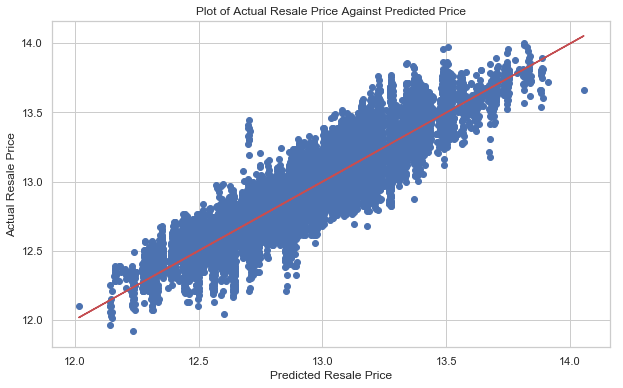

In [20]:
plt.figure(figsize = (10, 6))
plt.scatter(model.predict(X_test), y_test)

plt.title("Plot of Actual Resale Price Against Predicted Price")
plt.ylabel("Actual Resale Price")
plt.xlabel("Predicted Resale Price")

#plot polyfit line
pred_p = model.predict(X_test).flatten()
actual_p = y_test
trend = np.polyfit(pred_p, actual_p, 1).flatten()
trendpoly = np.poly1d(trend) 
plt.plot(pred_p, trendpoly(pred_p), "r-")

plt.ioff()

# 7. Conclusion 

We observe that the results from our linear regression model prior and after cross validation are similar, we are hence certain in the quality and validity of the constructed model.

As Singapore continues to increase its population size and housing initiatives, potential property owners and agents can look to a few key few factors in aiding them in the decision making process on whether to buy or sell a property. This will be further elaborated on in the report. However, as with all predictive models, users need to be wary and cognisant of ever-changing geopolitical lanscape and changes in the Government's policies. There may also be other factors not included in this model, such as the *quality* of the school nearby, and possible historical significance of certain properties. A commonly known tactic among agents is to assess their potential client's intention of buying a home - whether for staying or for investment. This may also distort quoted prices. Similarly, for home buyers with an intention for staying, there may be unique factors which may cause them to be willing to value the property at a higher price, such as being close to parents, or good *feng shui*. Nonetheless, this model provides a quantitative method to estimate, within confidence bounds, a benchmark for an acceptable valuation, before individual buyers and agents make their decisions.